In [1]:
%matplotlib inline

In [2]:
import pandas_datareader.data as web
import pandas_market_calendars as mcal
import pandas as pd
import datetime as dt
import numpy as np
import math
import time
from matplotlib import style
from termcolor import colored
import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import scipy.stats
from scipy.integrate import quad
from scipy.integrate import simps
from numpy import trapz

<h1><center>Geometric Brownian Motion simulation for stock prices</center></h1>

<h1><center>How can we benefit from a random element. Introduction to the Monte Carlo methods.</center></h1>


<h1><center>Prepared by Petar Tsvetkov</center></h1>

<br>
<br>
<br>
<br>


### Table of content

0. Intro
1. Why is randomness important?
2. Monte Carlo methods and a little data
3. Specifying our model
4. Drift and Diffusion in Geometric Brownian Motion
5. Simulations and predictions
6. Extending the simulation with VaR calculation
7. Final result
8. Conclusion
9. Improvement of this article and model itself
10. Resources used

<br>
<br>
<br>
<br>
<br>

### 0. Intro

#### What is simulation?

In any field at the current world, we are always faced or at some point coming at - seeing something happening, isn't it the world all about that? If nothing is happen what is actually happening? The planet itself, the humans, the weather, all of the machines and processes built from people or something else, the plants and everything else is basically changing, moving or acting in some way. So with having that said and with the humans curiousity we are always interested on investigating, analyzing, trying to improve something, whether it is for scientific purposes or personal interest, it simply happens. Now lets imagine we have the лife expectancy and we want to improve it for all the people around the world. Can we afford to waste or loose a human life? Probably not and here is why we would want to use any simulation.

A simulation is an approximate imitation of the operation of a process or system that represents its operation over time. Using this approach with the suitable and correct data, we can save ourselves a lot of mistakes that will usually happen to the real/actual target of our experiment. If we manage to find a proper way to imitate any action or process, we can actually simulate it as many times as we want or need and directly apply some changes or improvement to the target process or action. Of course any simulation is coming with a lot of planning, collecting data, implementing, analyzing, testing and many other phases, before we are ready to make any use of it. Simulations are basically applied at every field and they can be visualized through different methods, it does need to be some kind of a chart, plot or table, sometimes it can be something quite abstract.

Imagine we take all of the planets at our system and we manage to simulate all of their movements precisely. This could help in a situation where for example external object is coming at any of these planets, we can estimate where it is expected to hit, how to prevent it or something like this. If we manage to effectively and accurately simulate an infection spreading, we can apply more successfully any actions to be taken for its clearing Applications are everywhere around us and almost all of the times simulating something is really helpful.

A major problem when it comes to simulating something is gathering the data. The input data for any simulation is probably more than half of the job, because with trash data we would not expect any meaningul results. This is a problem that does not have its answers at some fields still and is a matter of a separate explanation article, so I will just leave this short explanation as the end of this "What simulation is?" question.

### 1. Why is the randomness important ?

In the real world we often have some tasks or things to work with, which are not able to be resolved with a straight forward approach, simply replacing what you have to and get the results you want. Most of the times in some really important real world scenarios, we have a big problem and it is that we cannot predict (it is hard to predict accurately) some part of the information we need. A nice example of this one is all of the problems where we have the human factor involved. If we take the stock market, a lot of the people will probably directly guess that it is really complicated, but for sure there are some individuals, usually with some elite degrees of education in finance, which are well prepared and can better understand these markets and how they work. What if we put this on a test and say that it is only partially correct ?

Lets say we have a set of stocks and we go to some investment professionalists, they will definetely give us some good advices and eventually a direction of how the stocks will probably move in the future, they can even help us to get a profit from this with the knowledge they have. This approach is definetely the primary one and looks to be the correct one, but there is one tricky part in this. The stock market can be easily manipulated by some news for the company or the equity - how it performs at the moment, if it has any issues, if it find difficulties with finance, etc. and guess what, these news are directly coming from humans, moreover there are people on the other side, which are only aiming to make profit from the price changes due to news releases, it is even possible to make fake news and artificially impact the stock price temporary or constantly. Another thing is that the stock prices are dependent on the buy/sell from the BIG investors and these big buy/sells are being done from humans based on some personal, company, country decisions, this is crucial for the stock market overall. So you probably get the idea that the human element can be really surprising and cannot be predicted or taken as a constant in some assumptions. Having that said, if we want to predict a selected stock future price, we cannot rely on what we have on 100%, because the humans involved can always change the situation.


It worths mention at least one other opinion or experiment on this one, so here it is shortly.

Mark Skousen an American economist and writer, first asked his students in the “Financial Economics” class to select one stock which would be a good performer and then told the same to throw a dart on a board containing 1000 stocks. By the end of the semester, after averaging the returns, it was found that the portfolio of stocks which were selected by throwing darts outperformed the carefully selected stock portfolio.

Well at first glance the above looks really legit, isn't it ?


The purpose of this article will be to try find ourselves, whether we can get any valuable information from some kind of randomness. For this we will work with some stock data, which appears to fit really well for such tests as it has a lot of historical data already and has all of the variables we need. We will try to use, analyze and make simulation through the Geometric Brownian Motion (GBM), which I will try to describe in the below lines, focusing on its components and the variables needed for our tests.

### 2. Monte Carlo methods and a little data

Monte Carlo (MC) methods are a subset of computational algorithms that use the process of repeated random sampling to make numerical estimations of unknown parameters. They allow for the modeling of complex situations where many random variables are involved, and assessing the impact of risk. The uses of MC are incredibly wide-ranging, and have led to a number of groundbreaking discoveries in the fields of physics, game theory, and finance. There are a broad spectrum of Monte Carlo methods, but they all share the commonality that they rely on random number generation to solve deterministic problems.

Monte Carlo simulations are named after the gambling hot spot in Monaco, since chance and random outcomes are central to the modeling technique, much as they are to games like roulette, dice, and slot machines. The technique was first developed by Stanislaw Ulam, a mathematician who worked on the Manhattan Project. After the war, while recovering from brain surgery, Ulam entertained himself by playing countless games of solitaire. He became interested in plotting the outcome of each of these games in order to observe their distribution and determine the probability of winning. After he shared his idea with John Von Neumann, the two collaborated to develop the Monte Carlo simulation. Later both worked, using newly developed computer technologies to run simulations to better understand the risks associated with the nuclear project. As you can imagine, modern computational technology allows us to model much more complex systems, with a larger number of random parameters, like so many of the scenarios that we encounter during our everyday lives.

Without starting some complicated explanations lets give a simple example - a game of blackjack - king of trivial for showing the Monte Carlo approach.

If we wanted to find the probability of getting blackjack (an ace along with a ten-valued card), we could simply count the number of possible hands where this is the case, and divide by the total number of possible combinations of cards to get the probability (its around 1/21, if you are curious). But now imagine our sample space is much harder to compute, for example our deck of cards has thousands as opposed to just 52 cards, or better yet we don’t even know how many cards there are. There is another way to find this probability. We could hunker down at the table and play a hundred games, recording the outcomes as we play. We might get a blackjack 19, 20 or even 28 times, and assign the probability using any of those values. Seems like a pretty bad way to assess our odds at the casino, but hopefully we’re just playing for fun. Now if we go again and play a thousand, ten thousand, millions of times, the Law of Large Numbers states:

    "As the number of identically distributed, randomly generated variables increases, their sample mean (average) approaches their theoretical mean."
    
Besides being easily one of the most important laws of statistics, this is the basis for Monte Carlo simulations and allows us to build a stochastic model by the method of statistical trials.

So you are probably already thinking - "What are talking about?". Howe can we make such a broad spectrum of usage from the Monte Carlo methods - which are basically built upon one single idea - to have random element to help you solve a complicated problem.

I think sometimes any idea is better to be understood by giving a proper example and making a simple, proper visualization. Having that said lets see and do a quick compare with the different methods of computing a numerical integration. In analysis, numerical integration comprises a broad family of algorithms for calculating the numerical value of a definite integral, and by extension, the term is also sometimes used to describe the numerical solution of differential equations. The basic problem in numerical integration is to compute an approximate solution to a definite integral:

$$\int_{a}^{b} f(x) dx$$

to a given degree of accuracy. If f(x) is a smooth function integrated over a small number of dimensions, and the domain of integration is bounded, there are many methods for approximating the integral to the desired precision.

As you may guess, in Python and its computational and statistical libraries, there are already defined methods for numberical computation on integral and we can directly use them. One thing that we do not have pre-defined and we will implement it to see how it works is - how to perform a numberical integration with Monte Carlo method. Once we have such function, we can try to compare the final results with the other "standard" popular methods for numerical integration, we can also check the performance. Runtime is something really important is some fields and the Monte Carlo methods might not be the best performers on this criteria. The reason for this is I think already described from all of the lines above - most of the times in order to get a meaningful results from any statistical method and Monte Carlo method - we need a large enough number of attempts, which means that sometimes in some real world applications, a Monte Carlo method for simulating something can be performed tens of thousands of times and this can take a while, especially on a slower machine.

Lets try to implement a function for numerical integration with different methods. Note that we will implement from scratch only the Monte Carlo method, since it is in the topic of this article, others we will use directly from the Python packages. There are some popular examples of computin the $\pi$ through Monte Carlo approach, but we will try to build something that is generally working for different functions, so that we can test it properly.

In [3]:
def numerical_integration(f, x_min, x_max, num_points):
    """
    Parameters:
    f - function with 1 variable
    x0, x1 - two points given for generating x for f(x)
    N -- the number of random points
    """
   
    # Generating initial points data and marking the f_max value
    
    x = np.arange(x_min, x_max, 0.01)
    y = f(x)

    f_max = max(y)
    
    
    # Standard methods
    
    # We are taking directly prepared methods from the scipy library
    # This is considered acceptable for this function, since the "standard" methods are for comparison only
    
    
    # Manual calculation
    
    start = time.time()
    h = (x_max - x_min) / num_points
    temp_x = np.linspace(x_min, x_max, num_points)
    temp_y = f(temp_x)
    temp_area = np.sum(temp_y * h)
    end = time.time()
    final_time = "%.15f"%(end-start)
    
    print(f"Manual calculation area: {temp_area}")
    print(colored(f"Performed for: {final_time}", "red"))
    
    
    # Trapezoidal rule
    
    start = time.time()
    temp_area = trapz(y, x)
    end = time.time()
    final_time = "%.15f"%(end-start)
    
    print(f"\nTrapezoidal rule area: {temp_area}")
    print(colored(f"Performed for: {final_time}", "red"))
    
    # Simpson's rule
    
    start = time.time()
    temp_area = simps(y, x)
    end = time.time()
    final_time = "%.15f"%(end-start)
    
    print(f"\nSimpson's rule area: {temp_area}")
    print(colored(f"Performed for: {final_time}", "red"))
    
    # Fortran library QUADPACK
    
    start = time.time()
    temp_area = quad(f, x_min, x_max)
    end = time.time()
    final_time = "%.15f"%(end-start)
    
    print(f"\nQuad calculation area: {temp_area[0]}")
    print(colored(f"Performed for: {final_time}", "red"))
        
    # Generating the random points, usually the higher the N is the better result we can get
    # random x should be between x0 and x1 with size N
    # random y should be between 0 and f_max
    
    start = time.time()
    x_rand = np.random.uniform(low=x_min, high=x_max, size=(num_points,))
    y_rand = np.random.uniform(low=0, high=f_max, size=(num_points,))
    
    
    # Find the indexes for points below and above the curve of our function
    # below - y_rand[i] < f(x_rand)[i]
    # above - y_rand[i] >= f(x_rand)[i]
    
    ind_below = np.where(y_rand < f(x_rand))
    ind_above = np.where(y_rand >= f(x_rand))
    
    monte_carlo_area = f_max * (x_max-x_min) * len(ind_below[0]) / num_points
    end = time.time()
    final_time = "%.15f"%(end-start)
    
    print("\nMonte Carlo method:")
    print("Number of points above the curve:", len(ind_above[0]))
    print("Number of points below the curve:", len(ind_below[0]))
    print("Area under the curve:", monte_carlo_area)
    print(colored(f"Performed for: {final_time}", "red"))

    # Plot for the Monte Carlo method
    
    plt.figure(figsize=(10, 7.5))
    plt.plot(x, y, color = "red")
    plt.xlabel("X")
    plt.ylabel("Y")
    plt.title("Numerical integration with Monte Carlo method")
    plt.scatter(x_rand[ind_below], y_rand[ind_below], color = "green", s=10, label="Points below the curve")
    plt.scatter(x_rand[ind_above], y_rand[ind_above], color = "blue", s=10, label="Points above the curve")
    plt.legend(loc="lower left", ncol=3, fontsize=10)
    plt.show()

Manual calculation area: 0.7852521765742797
Performed for: 0.000000000000000

Trapezoidal rule area: 0.7843989211457779
Performed for: 0.000000000000000

Simpson's rule area: 0.7844471545844236
Performed for: 0.000000000000000

Quad calculation area: 0.785398163397448
Performed for: 0.001008272171021

Monte Carlo method:
Number of points above the curve: 422
Number of points below the curve: 1578
Area under the curve: 0.789
Performed for: 0.001983404159546


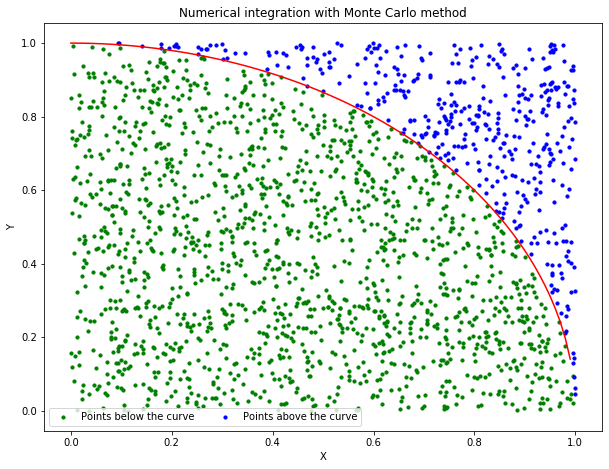

In [4]:
numerical_integration(lambda x: np.sqrt(1-x**2), 0, 1, 2000)

Manual calculation area: 63.51499344638013
Performed for: 0.000000000000000

Trapezoidal rule area: 63.50751750117285
Performed for: 0.000000000000000

Simpson's rule area: 63.507523938298185
Performed for: 0.000000000000000

Quad calculation area: 63.52881369943114
Performed for: 0.000000000000000

Monte Carlo method:
Number of points above the curve: 1423
Number of points below the curve: 577
Area under the curve: 58.896545742069094
Performed for: 0.000998973846436


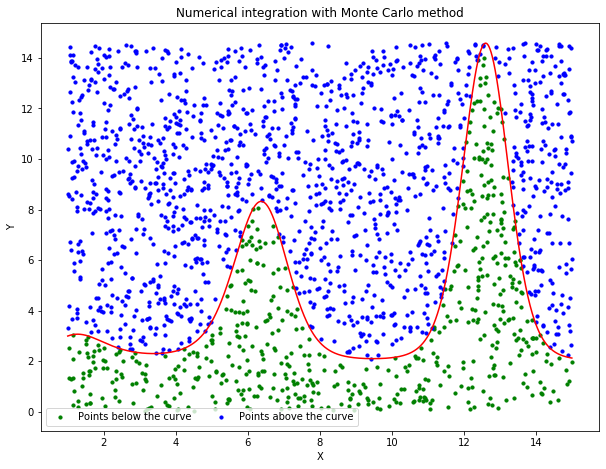

In [5]:
numerical_integration(lambda x: x**np.cos(x) + 2, 1, 15, 2000)

Manual calculation area: 22062.338487047386
Performed for: 0.000000000000000

Trapezoidal rule area: 21804.762220936624
Performed for: 0.000000000000000

Simpson's rule area: 21804.581421828843
Performed for: 0.000996351242065

Quad calculation area: 22023.747512978258
Performed for: 0.000000000000000

Monte Carlo method:
Number of points above the curve: 1786
Number of points below the curve: 214
Area under the curve: 21000.428742695767
Performed for: 0.000000000000000


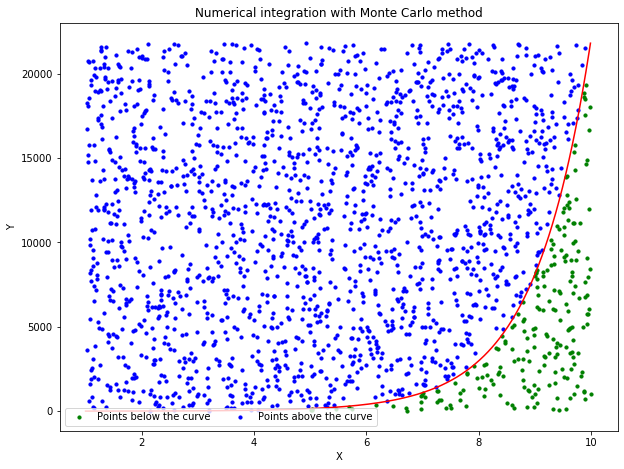

In [6]:
numerical_integration(lambda x: np.exp(x), 1, 10, 2000)

No as we have our function built, we see the result and performance from 3 different method. Note that the performance is quite good for all of the methods, but as we use 12 point precision, the difference from 12 zeros to 0.0009 is not quite small and also we working with really simple calculation. We are also using the numpy library for almost all of the operations and this one is also quite good performer through the different libraries.

Initial tries are done for 3 functions with 2000 number of random point and to be honest, it is giving fairly good results, compared to the other methods, which are reliable through all of the engineers and scientists all around the world. At this point we are just trying to do a quick compare between the methods and we are actually not interested in what is the real value of these numerical integration, however in a situation where all of the functions are striking at the same number and result, it is probably the correct one. Because of the randomness, if you try any of these a couple of times, you will find out that every time the numerical integrated value from the Monte Carlo method will be slightly different and that is expected for this appraoch, however if every time we receive a really close results it is still something to be considered as something we can trust.

No do you remember the [Law of large numbers](https://en.wikipedia.org/wiki/Law_of_large_numbers) ? What if we give number of random points to be generated for our Monte Carlo method with an extremely high number, higher enough to think that it is impossible for a human to do it without a computer. With results that we have already saw, I think the results with 100 000 number of random points generated will be something quite real that we can trust. 

Let see!

Manual calculation area: 0.7853953001188161
Performed for: 0.008910179138184

Trapezoidal rule area: 0.7843989211457779
Performed for: 0.000000000000000

Simpson's rule area: 0.7844471545844236
Performed for: 0.000000000000000

Quad calculation area: 0.785398163397448
Performed for: 0.000000000000000

Monte Carlo method:
Number of points above the curve: 21400
Number of points below the curve: 78600
Area under the curve: 0.786
Performed for: 0.003989219665527


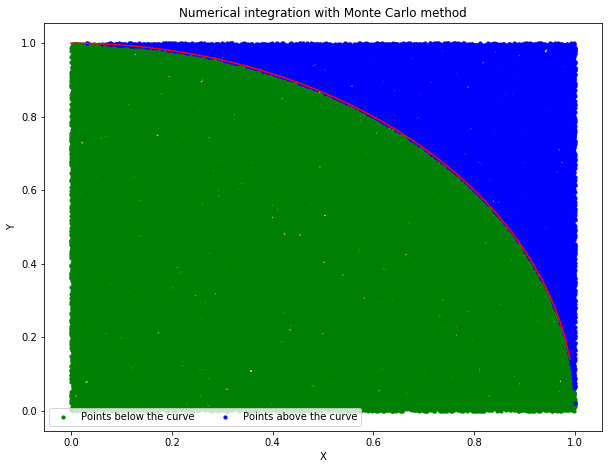

Manual calculation area: 63.528537356174205
Performed for: 0.006971120834351

Trapezoidal rule area: 63.50751750117285
Performed for: 0.000000000000000

Simpson's rule area: 63.507523938298185
Performed for: 0.000000000000000

Quad calculation area: 63.52881369943114
Performed for: 0.000998973846436

Monte Carlo method:
Number of points above the curve: 68862
Number of points below the curve: 31138
Area under the curve: 63.567439906986046
Performed for: 0.012963771820068


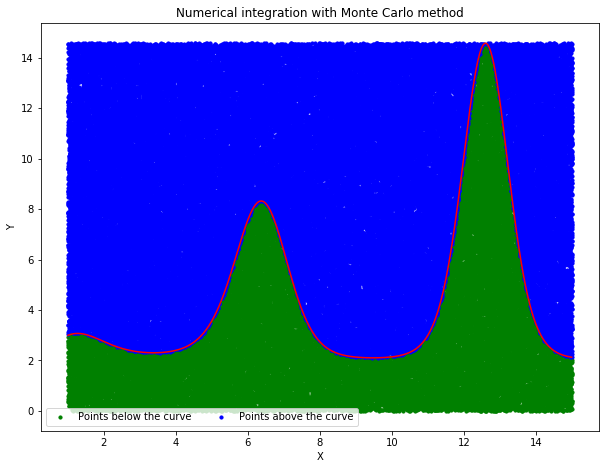

Manual calculation area: 22024.51860365275
Performed for: 0.001995325088501

Trapezoidal rule area: 21804.762220936624
Performed for: 0.000000000000000

Simpson's rule area: 21804.581421828843
Performed for: 0.000000000000000

Quad calculation area: 22023.747512978258
Performed for: 0.000000000000000

Monte Carlo method:
Number of points above the curve: 88780
Number of points below the curve: 11220
Area under the curve: 22021.010326452946
Performed for: 0.002991914749146


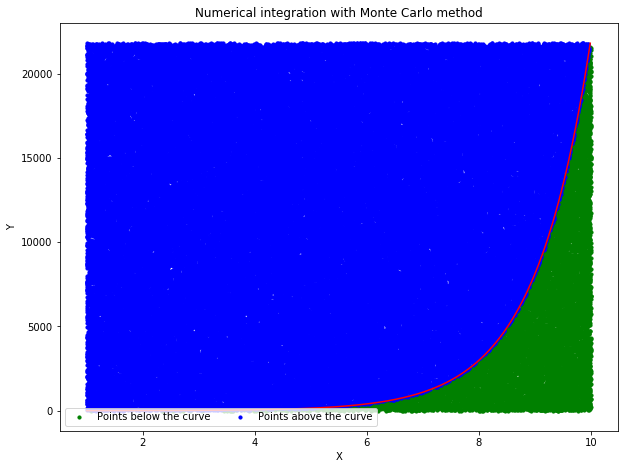

In [7]:
numerical_integration(lambda x: np.sqrt(1-x**2), 0, 1, 100000)
numerical_integration(lambda x: x**np.cos(x) + 2, 1, 15, 100000)
numerical_integration(lambda x: np.exp(x), 1, 10, 100000)

Here are our results, they are not bad aren't they ? Of course we see that for this approximately accurate results, we are paying the price of some time spent in addition, compared to the other methods, there is some more time spent in addition for the "manual" calculation, but I have just tried to give different point of views. In a real world scenario, one would always stick to the predefined methods for such calculations. While we stick to only zeros in the performance for the rest of the methods (almost always), we see that for the Monte Carlo method, the higher accuracy we want to achieve, the higher price we pay in terms of time spent. It worths saying that at some applications and fields the time is really expensive and even can save lifes!

Note that we are not trying to break the Monte Carlo method for a numerical integration, because for sure there are functions and exmaples where this appraoch can give terrible results compared to the other, we are just trying to see whether we can get meaningful results with a method that is basically relying on a little randomness. For example if we are trying to integrate something very sharply peaked and zero eleswhere then Monte Carlo will do a terrible job because there are only a few points where the function is nonzero. On the other end of the spectrum, consider a function whose derivative goes from small to large in small bursts, then the Monte Carlo method will be expected to give average good results.

A lot of smart people during the years tried to and gave a complex definitions on the details and what Monte Carlo method is, its specifics, applications, etc. We are not going to deeply analyze the whole methodology, I think with the above explanations and examples our mission is lets say accomplished. 

We saw that using a simple idea of having a random element can help us in resolving complicated tasks, in our particular example to compute a numerical integration. Even though we are spending some time in addition, we can confirm that most of the times when we compare the final result to some other methods, the numbers really make sense and are something we can trust sometimes. Extending these words we can also say that in the world, there are a lot of really complicated and hard things to compute, simulate or try to predict for the future. For such tasks the primary method is not always the best one, in practice it appears that the Monte Carlo methods are really useful.

##### Now lets show that "little data" I have promised and give an initial spoiler to the main topic of this article

You have probably noticed that most of the times we refering to and talking about Monte Carlo methods. The main reason for this is that the root idea of this approach is to use randomness to solve problems and during the time and because of the different applications - there are of course different methods using the Monte Carlo idea.

The main model for simulation that we will review and talk about is called Geometric Brownian motion. I am sure you will get more familiar with this one in details a couple of lines later, so now lets give some data details and show them, so that you will start getting into the idea of what we will work on/with. 

We are going to apply our model to a quite popular problem in the real world, which is also quite difficult as well. I am sure no one will doubt, that all of the fields which have the human factor are really illogical sometimes, in fact we can say that the human factor is quite unpredictable, but luckily we have a model and method that can be applied to such situations. The main target for our model will be stock market, more precisely the New York Stock Exchange, which in short words is the place where the money are being made. On this market almost everyone (if one has enough money of course) can buy or sell different equities, for a companies which are called public (public means they are traded on such markets). Stock markets are really complicated and I do not want to try giving them an exact definition, but again a couple of examples will probably help everyone to understand what is happening in there.

Probably everyone have heard or even saw somewhere a product of companies like - Apple, Microsoft, Tesla, Intel, Daimler, BMW, etc. No suppose you can get and buy a small piece from Apple, if you have enough money you can actually buy all of the small pieces available and stack them into one not such small one. These small pieces are called shares and a company could have millions, billions of shares in total - some of which are available for public trade. Lets say you want to get a share and you pay for it 100 USD. You can keep this one, but let me break your dreams - you will probably not get a great divident paid for one single share. What you can do on the other hand is to sell this small piece, but why would you? The answer is quite easy - to make profit of it. Imagine you get your share for 100 USD and you sell it 1 month later for 200 USD - that is 100% return for 1 month, which is ... great. If you have bought 500 000 shares, you would be a millionare after 1 single month, without making anything, just keeping your shares.

So you probably get the idea and why this is a huge interest of basically ... all of the people around the world. In fact some people say that nowadays money rule the world and all of the huge and big investments banks and fund are ruling all the money available out there. What these big investors are doing is simply putting their money into different shares (companies), that we have called pieces previously and expecting acceptable returns during a period, also know as - making money. Some of the investors out there are even doing this on a daily basis only - within 1 single day they are intensively buying and selling stocks and aiming to get profit of this.

So our idea here will be to try simulate how a selected company and its price will move in a time interval. This is really important as if you have a correct guess, you can put your money on the right place at the right moment, well its not only guessing game, but we are using simple words. The stock market data is usually public and everyone can access it, which means if you know how, you can do some models and do any kind of simulations, our target will be to show and prove that randomness can be really meaningful in the stock markets in total and you get some valuable information from a models, which in their core rely on the randomness really strong.

 For this article we will pick only 1 stock and try to work with it as an initial approach. The stock in action will be the one for the FactSet company (has a ticker in New York Stock Exchange of "FDS"). The data that we will get is basically available in the broad internet, so I've found a suitable library which will give us the data really easy, for an interval that we have.

Will start with getting some data for 1 year and plot it to see how it looks.
We will use the FactSet stock for the interval of 1-January-2019 to 31-December-2019.
FactSet is a fintech company, actually professionally implementing some risk models as well, with a team located in Sofia, Bulgaria.

In [3]:
# We will need the start and end dates, formated with the "datetime" library
# For these particular variables, the format will be: YYYY,MM,DD

start = dt.datetime(2019,1,1)
end = dt.datetime(2019,12,31)

# We will also store the stock ticker in a variable.
# Moving the implementation further, we can make it work with more than 1 stock, using a list of stock tickers.

stock_ticker = "FDS"

In [4]:
# Storing the stock data in variable "stock_data".
# For now we won't cut anything from the data, we will try to adjust as per our needs later on.

# For this example the parameters of our request include: stock ticker, where the data is coming from, start, end.
# Yahoo is the data provider for this example
stock_data = web.DataReader(stock_ticker,'yahoo', start, end).reset_index()

#### Important thing to note in here is that the stock markets data from New York Stock Exchange is available for the working days only in New York.

In [5]:
type(stock_data)

pandas.core.frame.DataFrame

Pandas package in Python is the ONE for working with data. Almost all of the times we will store our data in pandas data frame, which we can easily cut and manipulate.

In [6]:
stock_data # Lets see what we have in the whole data set.

,Date,High,Low,Open,Close,Volume,Adj Close
0,2019-01-02,201.529999,197.089996,197.089996,199.399994,323500.0,196.783066
1,2019-01-03,199.470001,193.830002,198.839996,194.000000,336800.0,191.453949
2,2019-01-04,201.259995,195.419998,196.960007,200.039993,276700.0,197.414673
3,2019-01-07,201.059998,198.270004,198.550003,200.250000,398300.0,197.621918
4,2019-01-08,202.850006,199.509995,201.320007,202.720001,222300.0,200.059494
...,...,...,...,...,...,...,...
247,2019-12-24,268.790009,266.959991,268.739990,267.059998,111700.0,266.396759
248,2019-12-26,269.640015,267.170013,268.399994,268.940002,143500.0,268.272095
249,2019-12-27,272.910004,268.450012,269.929993,271.100006,226700.0,270.426758
250,2019-12-30,271.579987,266.700012,271.529999,267.690002,285500.0,267.025208


A short explanation is worth to be mentioned on the data set, so that from now we will know what we are talking about. In the stock markets there are a lot indicators, but some of them are really important and have extracted some important ones.

$Date$: This is the trade date or with other words the working day date for New York Stock Exchange, note its only working days.

$High$: This is a price in USD, indicating the highest price for the day for the stock we are lookin at.

$Low$: This is is a price in USD, indicating the lowest price for the day for the stock we are looking at.

$Open$: This is a price in USD, indicating the start price at the market open (start of working hours for the day).

$Close$: This is a price in USD, indicating the closing price at the end of working hours and day at the stock market.

$Volume$: This is the actual number of shares traded for the stock/equity on the particular day we have.

$Adjusted Close$: This is a price in USD, which indicates the closing price after adjustments for all applicable splits and dividend distributions. The difference is that while the closing price is just a raw number at the market close, the adjusted close is the same price, but all of the factors that may affect this price outside of the market are taken into consideration in here.

In [7]:
stock_data["Close"] # We cam easily get only one columns if we need.

0      199.399994
1      194.000000
2      200.039993
3      200.250000
4      202.720001
          ...    
247    267.059998
248    268.940002
249    271.100006
250    267.690002
251    268.299988
Name: Close, Length: 252, dtype: float64

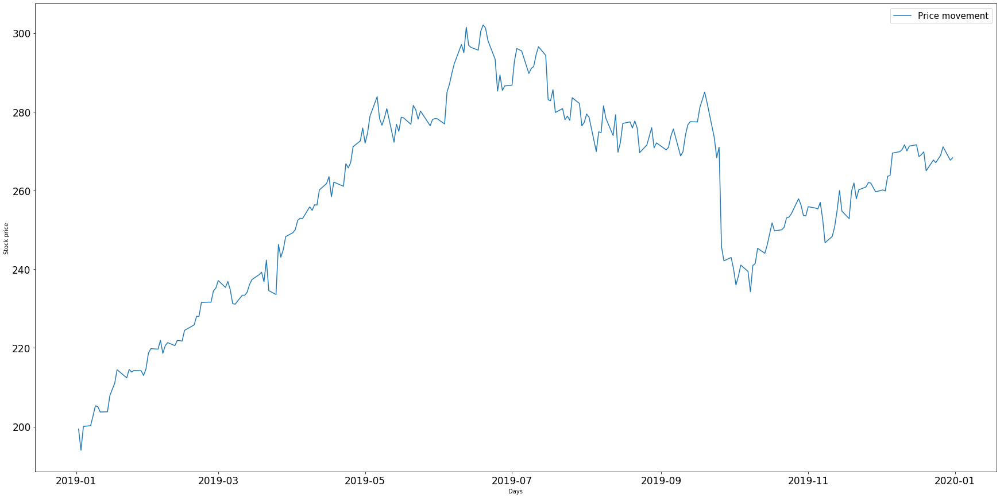

In [9]:
# Lets try to visualize the raw data that we got for 2019.

plt.figure(figsize=(30, 15))
plt.tick_params(labelsize=17)  # Optional one, can be adjusted
plt.plot(stock_data["Date"], stock_data["Close"], label="Price movement")
plt.xlabel("Days")
plt.ylabel("Stock price")
plt.legend(prop={'size': 15}) # The size is optional az well, can be adjusted
plt.show()

Geometric Brownian Motion is widely used to model stock prices in finance and there is a reason why people choose it. If we focus on the above plot and try to follow the stock price move isolating the small details, we can really see that it has some long terms pattern. For the data above, we can say that from 2019 January till 2019 July the stock price overall goes UP. From July till November and then end of the year in December the stock goes more or less DOWN overall compared to its highest value for the year in June/July.

Now lets plot only one month from the 2019 year and see what we will have there. With other words, zoom into the above plot.

In [10]:
# We can isolate only one month data with some additional pandas methods in a single line.
# Pretty isn't it ?

mask = (stock_data['Date'] >= '2019-12-1') & (stock_data['Date'] <= '2019-12-31')

# We store the one month data in a variable.

one_month_data = stock_data.loc[mask]

In [11]:
# Again list the data first and also note that we get the working days ONLY !
# tail method give the wanted last rows.

one_month_data.tail(2)

,Date,High,Low,Open,Close,Volume,Adj Close
250,2019-12-30,271.579987,266.700012,271.529999,267.690002,285500.0,267.025208
251,2019-12-31,269.450012,267.019989,267.019989,268.299988,259600.0,267.633698


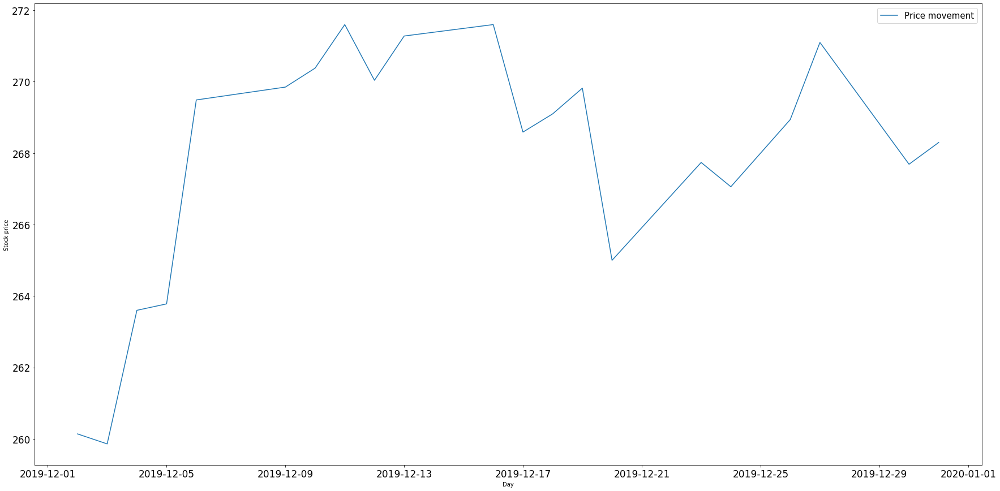

In [12]:
# Lets try to visualize the raw data that we got for December 2019 only the same way.

plt.figure(figsize=(30, 15))
plt.tick_params(labelsize=17)  # Optional one, can be adjusted
plt.plot(one_month_data["Date"], one_month_data["Close"], label="Price movement")
plt.xlabel("Day")
plt.ylabel("Stock price")
plt.legend(prop={'size': 15}) # Optional one, can be adjusted
plt.show()

If we focus now on a short terms interval, we see that it also has an overall trend, which looks to be upwards, but the stock is not just going smoothly on its path, it has some short terms changes which are more or less leading to the final price, but they appear to be really hard to predict, as there seems to be no pattern in these movements. Moreover if we focus on all of the months individually, we will probably be more confused.

So to sum it all up from the above data. For our purposes, we can assume that we have 2 really important things to influence our stock price.
    1. The overall stock price move, whether it goes up or down (like a trend).
    2. The random element which is able to change our price, at this case on a daily basis (short term one).
        2.1. Its more accurate to say that the the stock price is changing constantly though the whole day,
                but for this article we won't zoom that much.
    
    
    
Here the Geometric Brownian Motion comes into play. GBM has two components which suit really well in the data described above. One component incorporates the long-term trend while the other component applies random shocks that are able to change our data as well.

There are also some other important things about our model, but let us consider this as an intro and take a look at the details below.

### 3. Specifying our model

I want to start with putting a short definition coming from the one and only Wikipedia page for the [Geometric Brownian motion](https://en.wikipedia.org/wiki/Geometric_Brownian_motion).


"A Geometric Brownian motion (GBM) (also known as exponential Brownian motion) is a continuous-time stochastic process in which the logarithm of the randomly varying quantity follows a Brownian motion (also called a Wiener process) with drift."

The GBM is actually using the [Stochastic differential equation](https://en.wikipedia.org/wiki/Stochastic_differential_equation), proving of which deserves a whole separate article, but here is the definition that we will take for granted and put it out there just as a start.

A stochastic process $S_t$ is said to follow a GBM if it satisfies the following stochastic differential equation (SDE):

$$d S_{t} = \mu S_{t} dt + \sigma S_{t} d W_{t}$$

Where as of now we will just mention that the $\mu$ ("the percentage drift" and also mean of historical returns) and $\sigma$ ("the percentage volatility" and also the standard deviation of historical returns) are constants in this equation.

$W_{t}$ is a Wiener process or Brownian motion which will become more clear below.


We will describe one by one all of the parameters and finally will come up with the final model, but as of now for our purposes, we will put the input parameters and give them names in the context of describing stock data with them in the Geometric Brownian motion model.




   $S$ - this will be our stock price
   
   $dt$ - the time elapsed or also time increment, for our case as we recieved daily stock info - 1 day
   
   $T$ - length of our prediction/simulation, this will be in the same unit as the elapsed time
   
   $\mu$ - the mean of historical daily return
   
   $\sigma$ - the standard deviation of historical returns
   
   $b$ - this will ne an arary storing our random values
   
   $W$ - Another array which will store the random values for the actual day, taking into consideration the previous ones.
   
   
   





So for easier implementation in here we are adding some variables in addition, but what really matters for the model and can be found in all of the sources for the Geometric Brownian Motion are:

$S$ - stock price

$\mu$ - return

$\sigma$ - standard deviation of returns

$b$ - our random variable, at this case we simply store it in a list

$dt$ - the elapsed time period




Some of you may find really interesting what stochastic process it, so to put a little clarification on this one here, this is a special word to classify a random process as a mathematical object and study it. Of course I will try to put some mathematics in this article starting from now on, but it will be mostly for the Geometric Brownian motion model and simulation itself.

#### 3.1 Stock price

Lets get an extract of our stock price and try to understand it. Let us start with the fact that at some informational pages the Geometric Brownian Motion (GBM) is classified as technically a [Markov process](https://en.wikipedia.org/wiki/Markov_chain), shorly said, this is a random process whose future probabilities are determined by its most recent values. This is really important as even though we have as a start point the stock data for 1 year, we are actually taking only the LAST closing price of it as our initial point for the prediction. Of course it is fair to say that the last closing price at the end of each year is more or less dependent on the previous days - "techically", but for this model it is important to state that we are starting with the last one !

We already have our stock data in a variable, so lets get the stock price that we need.


In [13]:
# We will store the stock price in "S". We get this easy with some pandas methods and indexing.
# We will also store the time point of this last price, at this case it is 31st of December 2019

S = stock_data["Close"].iloc[-1]
last_day = stock_data["Date"].iloc[-1]


last_day, S

(Timestamp('2019-12-31 00:00:00'), 268.29998779296875)

Later on we will use this initial for the model stock price, multiply it with some values and try to make a prediction.

#### 3.2 The elapsed time period

This is the elapsed time period from one price to another when we look at the historical data we have - we have 1 year of historical data on a daily basis. Having that said we will continue following this date increment pattern for our simulations as well, so our time increment or elapsed time period from one price to another will be 1 day.

In order to accurately get the time unit here, we will use 2 lines from the historical data we have - the last 2 ones, this way we will be sure that this is not just a number we put as a constant, because at some scenarios it could not be the same.

In [14]:
# Here we are getting the last 2 rows from the data set we have and extract the time difference between them.
# This will be the time increment for our simulation and it 100% corresponds to the historical data we have.

# It is upper letter for a reason, since we use the "dt" in our imports as alias

DT = (stock_data["Date"].iloc[-1] - stock_data["Date"].iloc[-2]).days

DT

1

In the same section here, we will also define and store an additional parameter, which will later be very useful for our implementation. This is the time period for our simulation/prediction. For example we have our 1 year of historical data and we will try to analyze and make predictions for the following month of it, if we look at historical data for 2019 - the following month will be January 2020. What we care about this month is - how many prediction days we have there, these will be all of the working days for the NY Stock Exchange in the target month.

In [15]:
# We are defining a simulation interval, for this particular case it will be the January 2020

simulation_start = dt.date(2020,1,1)
simulation_end = dt.date(2020,1,31)

Since we need the New York Stock Exchange working days only (we know that stocks are buy/sell only during these days), we will aim to get this data only for the prediction time interval.
To do this we will use another library called $pandas\_market\_calendars$, this one is basically storing some predefined calendars, where we can find the dates we need.

In [16]:
# First we store our calendar in a variable called "NYSE" - this is what we need only.
# Then we can easily see the so called valid days in our interval. 
# If wee see the len() of these valid days, we get the number that we need.
NYSE = mcal.get_calendar("NYSE")

working_days = NYSE.valid_days(simulation_start, simulation_end)

len(working_days)

21

Finally we will store the interval of our prediction in a separate, dedicated variable that we will use later on for our simulation.

In [17]:
# This will be the length of our prediction

T = len(working_days)
T

21

#### 3.3 The mean return from our closing prices $\mu$

This is really important and will represent the mean return of the historical prices in our historical date interval. Before calculating $\mu$ we should calculate the return for each trading day we have for 2019.
The formula for the return is as follows:

$$r_{k} = \frac{S_{k} - S_{k-1}}{S_{k-1}}, \forall k$$    $$k: time period$$


Where $S_{k}$ is the current stock price at our time point, $S_{k-1}$ is the stock price at our time point -1. This is calculated for every time point/period.

In [18]:
# The pct_change() method will automatically get the job done for us, for the whole period of historical data

returns = stock_data["Close"].pct_change()

In [23]:
returns[0:10]

0         NaN
1   -0.027081
2    0.031134
3    0.001050
4    0.012335
5    0.012678
6   -0.001072
7   -0.006632
8    0.000295
9    0.020170
Name: Close, dtype: float64

Just to prove and show the above is working let us get the first 2 rows of our historical data and calculate the first return manually. The return is calculated based on the closing price only.


In [19]:
stock_data.head(2)

,Date,High,Low,Open,Close,Volume,Adj Close
0,2019-01-02,201.529999,197.089996,197.089996,199.399994,323500.0,196.783066
1,2019-01-03,199.470001,193.830002,198.839996,194.000000,336800.0,191.453949


In [20]:
current_price = stock_data["Close"].iloc[1]
price_at_previous_day = stock_data["Close"].iloc[0]
manual_return = (current_price - price_at_previous_day) / price_at_previous_day

In [21]:
returns[1], manual_return

(-0.027081213950727157, -0.02708121395072712)

Now lets calculate the mean return for our interval - our $\mu$.

For this one we have a method that will help us as well coming from Numpy.

In [22]:
# It is a matter of one line calculation, really easy.

mu = np.mean(returns)
mu

0.0012829155344265951

#### 3.4 The standard deviation $\sigma$

This is the standard deviation of returns for the stock price historical data that we will use. In finance this calculation based on the returns has importance and it will help us to build our future random element. The higher the standard deviation is, the greater the variance between each price and the mean, which shows a larger price rance. For example, a volatile stock has a high standard deviation, while the deviation of a stable stock is usually rather low.

A formula for the standard deviation in the context of stock market could look as follow:

$$Standard Deviation = \sqrt{\frac{\sum_{i=1}^n (x_i - x)^2}{n - 1}}$$


Where:

$x_i$ is the value of the $i^{th}$ point in the data set

$x$ is the mean value of the data set

$n$ is the number of data points in the data set

There are methods available for the standard deviation in both the packages - Numpy and Pandas, we will use the one from Numpy, just because we have calculated the mean return with the same.

In [23]:
# Using the Numpy standard deviation calculation

sigma = np.std(returns, ddof=1)
sigma

0.014067414237336694

So with the above being said and the result of our $\sigma$, we can say that for the time being in our historical data, our stock looks pretty stable.

#### 3.4 Random element $b$

So here comes the key part of our model - the random element that will influence the stock price and eventually give us some valuable prediction results. This will be the so called shock for the model, that will show us how the randomness works.
In this step we won't discuss on the number of simulations that we will start, we will only take a look on how we are picking the random element and prove that it is a real random one (as much as we can afford in here), independent on all of the other input parameters that we have.
So we are basically not goind to multiply this random number with anything for its initial generation, what we will try to do is to generate a random element from the standard normal distribution. A standard normal distribution is a special case of the normal distribution where a normal random variable has a mean of zero and a standard deviation of one, therefore we will not use our predefined already $\mu$ and $\sigma$, instead we will stick to $0$ and $1$.

This is pretty straight foraward to achieve using the Numpy library, for the above criterias we are picking the following one:
$numpy.random.normal()$

It is important to mention that the normal distributions are important in statistics and are often used in the natural and social sciences to represent real-valued random variables whose distributions are not known. Their importance is partly due to the [central limit theorem](https://en.wikipedia.org/wiki/Central_limit_theorem). It states that, under some conditions, the average of many samples (observations) of a random variable with finite mean and variance is itself a random variable whose distribution converges to a normal distribution as the number of samples increases.

We can even go for a simple simulation on this one only will look like on a plot:


In [29]:
def plot_distribution(x, mu = 0, sigma = 1):
    """
    Plots the Gaussian distribution with parameters mu and sigma. The parameter x specifies 
    the values where the function is evaluated at
    
    By default we set this to be a standard normal distribution:
    with mu = 1 and sigma = 1
    
    """
    distribution = scipy.stats.norm.pdf(x, loc = mu, scale = sigma)
    plt.xlabel("X")
    plt.ylabel("Y")
    plt.plot(x, distribution, color = "blue")
    plt.show()

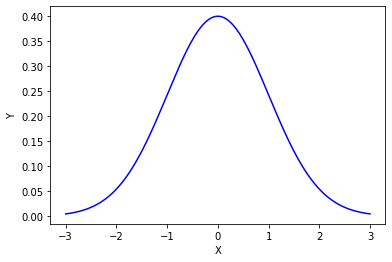

In [30]:
x_distribution = np.linspace(-3, 3, 1000)
plot_distribution(x_distribution)

In [32]:
# Using the np.random.normal with mean=0 and std=1

random_element = np.random.normal(0, 1)
random_element

-0.8093649941562364

A couple of attempts on the above 2 lines of code, will prove us that every time the random element is different one and that is really important. It does not follow any patter, the only thing we gave as a parameter is a mean of 0 and standard deviation of 1. If we have 100 prediction points, we will have 100% random element from the above with almost 0% chance of prediction on what this number will appear to be.

As you probably notice, we actually do have our $\mu$ and $\sigma$, so we can actually use these for the np.random.normal function and see the difference. This is a potential direction for extending our simulations later, once we have the finalized version of our function.

#### 3.5 Brownian path

We have already defined our random variable, which as we said is crucial for our model. What is also really important is the so called path of our model. Lets say we will predict 100 points in the future, or at least try to, if we take every single one of them, we already know how to shock the values with the previous random element that we can generate, but what if we want to take into consideration the previous shock as well, when we are at a point 50 lets say. In order to get this we will need our path, this path will basically incorporate all of the previous random shocks that we have so far and for itself again, it will be completely random, this value will be the total effect of randomness of our model.

With the above being said already, it start to be clear now, that instead of using a single random element in this model, what we will do is using the total randomness. If we are at point 50, we will need to apply all of the random shocks from 1 to 50 inclusive, which is basically our Brownian path.

We can summarize this up with a equation like the following one:

$$Brownian path = \sum_{i=1}^{k} b_{i}$$

$$k = 1, \dots , N$$


Where $b$ is our random element at the time point and $k$ corresponds to the time points that we have.


So we have defined the $Brownian path$, but how can we implement this ?
As you may gues we won't go on with a prediction of one single point only. So for the purposes of demonstration on how we will completely implement the total randomness later on, lets try to do it right now.

Lets assume that we will have 10 points for prediction. We will need to generate the random element 10 times for every point and then we will need to build our path, which will be a cumulative sum of all of the previous random elements, including the current one. Lets try to implement this in here.

In [33]:
# We generate the random elements for all of our points for prediction
# We are using the already described implementation for this and storing the result in a normal list
# For the demonstration in here it does not really matter whether it will be a python list or Numpy array
# It is also clear to see that these are completely random


random_elements = [np.random.normal(0, 1) for _ in range(10)]
random_elements

[0.5322292473190317,
 0.17123982715020036,
 1.0639892035721383,
 1.2543973633927685,
 1.19351131777735,
 -0.41090294114561576,
 -0.7140780890537207,
 -0.42962974833728956,
 -2.4173022311616177,
 1.414440073552208]

In [34]:
# Numpy gives us the "cumsum" method, which automatically evaluates the correct values at every point
# If we change the initial random values, the total randomness in here is changed as well

GBM_path = np.cumsum(random_elements)
GBM_path

array([0.53222925, 0.70346907, 1.76745828, 3.02185564, 4.21536696,
       3.80446402, 3.09038593, 2.66075618, 0.24345395, 1.65789402])

We saw that it is not so hard to get the cumulative summary of our random values, which is basically giving our final random list. Worth to be mentioned in here that if go for 100 simulations, we will have to create different random paths, as if we have the same values for every simulation will most likely end up the same. 

However what was important in here was to see what is the logic behind the GBM path and how are going to evaluate this from the random elements already generated for all of the time points in our simulation.

### 4. Drift and Diffusion in Geometric Brownian Motion

##### 4.1 $Drift$

At the beginning of this article we have tried to plot and see how a separate stock price is moving through a time interval. We have saw that for our historical data interval of 1 year we had an overall trend of the stock which was increasing, so we have called this one back then a long-term influence which reflects on our stock price. For the long term-trend, we do not zoom into all of the details, what we care about and see is the overall movement, we can also say that it can be - neutral, going up or going down. The assumption of this model is basically that we have drift and for each period our model will assume that the price will follow this drift that is related to the pre-calculated return and this drift will be "shocked" at some point by our randomness.

Lets see on what is the math equation behind the drift in this model and what we can conclude about it:

$$drift_{t} = \mu - \frac{1}{2} \sigma^2$$

First of we can definetely see that this will be a constant value. We have the $\mu$ and $\sigma$ pre-calculated and they are having nothing in addition, basically staying not changed.

The above - for our stock price - expands further to:

$$S_{t} = S_{t-1} * e^{drift_{t}} =  S_{t-1} * e^{\mu - \frac{1}{2} \sigma^2}$$


Another thing really important to be noticed in here, which proves how this model fits really well into investigating the stock markets is that since we apply this through the exponential function this can never become a negative number and as in real life, we can never have a stock with a negative price.

##### 4.2 Diffusion

The diffusion reflects to the short-term impact and how it shocks the price. The diffusion component is calculated by multiplying the random value with our $\sigma$ and this is how the randomness comes in our model basically. The main difference between the drift and diffusion components is that the drift stays constant, while the diffusion can actually change the stock price as it can vary, so that we can make different stock price predictions at this particular implementation, the diffusion component helps us to create as many different scenarios as we want. In real world scenarios actually, the implementations of such processes including random element are simulated as many times as possible to get any valuable information from all of the executions.

$$diffusion_{t} = \sigma Z_{k}$$

Where $Z_{t}$ stores our random value.

Summarizing the two components together is the way we can use this model. When making a prediction for any time period with a give price (for this implementation) for the previous time point, we need to include both of the Drift and Diffusion.
If we would use only the Drift, which is basically staying constant because of its calculation, we would always know what the stock price will become at a certain point. The diffusion component is the one giving us the un-predictive element, so that we will not observer a smooth increase or decrease trend for the stock price, instead we will see some fluctuation as well.

If we go to pack this all in a single equation with the drift and diffusion combined, it would look like:

$$S_{t} = S_{t-1} * e^(drift_{t} + diffusion_{t})$$

$$S_{t} = S_{t-1} * e^(\mu - \frac{1}{2} \sigma^2 + \sigma Z_{t})$$

#### 4.3 Before finalizing the equation

There are a lot equations for describing the full formula on this model and without doubt this can be really complicated. The elements that appear in the different sub-component of the drift and diffusion and then pack the whole equation are actually coming from solving the [stochastic differential equation](https://en.wikipedia.org/wiki/Stochastic_differential_equation) that we have stated earlier in our model specification.

It is quite a complicated one, but at the end, with an arbitrary initial value $S_{0}$ we come up with the following view:

$$\ln{\frac{S_{t}}{S_{0}}} = (\mu - \frac{\sigma^2}{2}) t + \sigma Z_{t}$$


Taking the exponential and multiplying both sides by $S_{0}$ gives the solution:

$$S_{t} = S_{0}\exp((\mu - \frac{\sigma^2}{2}) t + \sigma Z_{t})$$


From here it is actually already understandable, which are the 2 components of the model.

#### 4.4 Finalize our equation

Up until now, in the above, we have saw how the two components are being utilized in this model and what is the difference between them. Even though, we haven't gone through all of the involved calculations that are building these final sub-equations, I think the picture in the context of our simulation is starting to become more clear.

Lets try to find how the components will end up in an equation for all of the time points that we are going to work with.

We saw that in order to predict $S_{k}$ we are multiplying the $S_{k-1}$ with $exp(drift + diffusion)$, so lets continue with this pattern and see how we will end up if we have only our initial stock price.

$$S_{k} = S_{k-2} * e^({\mu - \frac{1}{2} \sigma^2 + \sigma Z_{k-1}}) * e^({\mu - \frac{1}{2} \sigma^2 + \sigma Z_k})$$

$$S_{k} = S_{k-3} * e^({\mu - \frac{1}{2} \sigma^2 + \sigma Z_{k-2}}) * e^({\mu - \frac{1}{2} \sigma^2 + \sigma Z_{k-1}}) * e^({\mu - \frac{1}{2} \sigma^2 + \sigma Z_k})$$

We are simply doing a replace of our initial equation in order to find it out for all of our time point. If we continue doing this we will end up having $S$ multiplied by many exponential terms. The final look of these steps looks like the follwing equation:

$$S_{k} = S * \prod_{i = 1}^{k} e^({\mu - \frac{1}{2} \sigma^2 + \sigma Z_{i}})$$

$$k = 1,\dots, N$$

If we include the drift and diffusion individually in the above we can extend it that way:

$$S_{k} = S * e^({\mu - \frac{1}{2} \sigma^2}) * \dots * e^({\mu - \frac{1}{2} \sigma^2}) * e^{\sigma b_{1}} * \dots * e^{\sigma b_{k}}$$

$$S_{k} = S * e^({(\mu - \frac{1}{2} \sigma^2) * k}) * e^{\sigma \sum_{i=1}^{k} b_{i}}$$

$$S_{k} = S * e^({(\mu - \frac{1}{2} \sigma^2) * k + \sigma \sum_{i=1}^{k} b_{i}})$$

The above equation means that we can predict $S_{k}$ from an initial price $S$ by adding the combined effect of $k$ many drifts and the cumulative diffusion up to $k$. From $S$ to $S_{k}$, there are $k$ many time points which we call as the path. The drift does not change from one point to another, so if we want to predict 20 points lets say, we simply have to include the drift to them, 20 times. The diffusion on the other hand is where we have included the random element, moreover we have introduced the Brownian path, which was cumulatively using all of the random elements, so that for example in our final point all of the previous ones are taken into consideration. Having all that said, it would be best if we use the path instead of the random element only.

With all of that we can make some replacements in the above equation and get the final view of it.


$$t_{k} = k$$

$$W_{k} = \sum_{i=1}^{k} b_{i}$$

Just to remind in here that we have already given this definition of the Brownian path, right not we are just giving this one a symbol - at this case $W$

Finally we can come up with:

$$S_{k} = S * e^({(\mu - \frac{1}{2} \sigma^2) t_{k} + \sigma W_{k}})$$

If we look closely in the above, we actually know or at least know how to calculate all of its components, which are basically describing the drift and diffusion.

We have our initial stock price $S$

We know how to calculate the $\mu$ and $\sigma$ from the returns of our closing prices

We are aware of the time increment unit, as we know the historical data is described on a daily basis and we follow this unit

We know how to build our random elements and with them we know how to build our path

### 5. Simulations and predictions

Since we already have enough explanation on the model itself and know what we need to make some simulations based on the historical data we have, we can now try to calculate it and plot it to see what will be the result.

It is important to mention that for the purses of this article, we have picked a historical interval of the whole 2019 year for almost all of the simulations generated, we are going to make some predictions and simulations for January 2020. However the functions will have the functionality to pick another historical data begin interval, which will respectively give a different prediction. The real data for this stock is actually already available for January 2020, so we can do some comparsion between our predictions and the real stock movement and eventually say something about that.

We have already saw how our raw data looks like, so what we can start with is try to do some simulations with the drift included only. If we are correct without the random element in the simulation, the price movement will be quite predictive - going up smoothly, or going down the same way.

In [34]:
def plot_intersection(x, y_1, y_2):
    """
    Description: This is a function to plot the nearest intersection on 2 Ys (lines) given.
    At the moment the function is working with 2 already available points for plot only.
    Finds the nearest point of intersection of the 2 lines and plots it as scatter
    The function does not have show() at the end, since it is invoked from another function with show(),
    in case this is at the exact end of another fucntion, show() must be included to present the whole plot.
    
    Parameters: 
    x(array) - stores the x axis
    y_1(array) - stores the first y axis for the intersection
    y_2(array) - sotres the second y axis for the intersection
    
    Return: Does not return anything in this version
    """
    intersections = []
    
    if len(y_1) > len(y_2):
        y_1 = y_1[:len(y_2)]
        
    
    idxs = np.argwhere(np.diff(np.sign(y_1 - y_2))).flatten()

    for idx in idxs:
        x1 = x.astype(int)[idx+1]
        y1 = y_1[idx+1]
        y2 = y_2.iloc[idx+1]
        current_diff = y2 - y1
        
        if idx == 0:
            intersections.append((x.astype(int)[idx], y_1[idx]))
        else:
            prev_x1 = x.astype(int)[idx]
            prev_y1 = y_1[idx]
            prev_y2 = y_2.iloc[idx]
            prev_diff = prev_y2 - prev_y1
            denom = prev_diff - current_diff
            intersections.append(((-current_diff*prev_x1  + prev_diff*x1) / denom, (y1*prev_y2 - y2*prev_y1) / denom))
    
    for current_intersection in intersections:
        current_value = current_intersection[1]
        current_i_date = pd.to_datetime(current_intersection[0])
        if intersections.index(current_intersection) == 0:
            plt.scatter(current_i_date, current_value, c="black", s=100, label="Intersection")
        else:
            plt.scatter(current_i_date, current_value, c="black", s=100)
    
    # Since this is invoked from a master function with another plot, no need to show in here.

In [35]:
def GBM_drift_simulation(stock, historical_data_start, simulation_start_interval, simulation_end_interval, number_of_simulations):
    """
    Description: Function to calculate a simple prediction based on Drift component from GBM only.
    The Drift is a constant value computed from the returns and the standard deviation of returns from our historical data.
    At the moment this is working with 1 stock given only.
    
    Parameters:
    stock(str) - name of the stock we want to do a simulation for
    historical_data_start(tuple) - format (YYYY,M,D) - start of our historical data, that we will use for reference
    simulation_start_interval(tuple) - format (YYYY,M,D) - start of the simulation interval + end of the historical data interval also
    simulation_end_interval(tuple) - format (YYYY,M,D) - end of the simulation interval
    number_of_simulations(int) - number of simulations computated
    
    Return: Does not return anything in this version
    
    """
    
    simulation_start_interval = dt.date(simulation_start_interval[0], simulation_start_interval[1], simulation_start_interval[2])
    simulation_end_interval = dt.date(simulation_end_interval[0], simulation_end_interval[1], simulation_end_interval[2])
    
    hist_data_start = dt.date(historical_data_start[0], historical_data_start[1], historical_data_start[2])
    hist_data_end = simulation_start_interval
    
    stock_data = web.DataReader(stock,'yahoo', hist_data_start, hist_data_end).reset_index()
    
    NYSE = mcal.get_calendar("NYSE")
    # If we use this for testing purposes only, we can check the already available data for the simulation interval
    # Using this data we can plot the stock price at the simulation interval end for comparsion

    current_stock_data = web.DataReader(stock,'yahoo', simulation_start_interval, simulation_end_interval).reset_index()
    current_stock_price = current_stock_data["Close"]
    current_stock_day = current_stock_data["Date"]

    # Price from the last day of the historical data
    
    S = stock_data["Close"].iloc[-1]
    last_day = stock_data["Date"].iloc[-1]
    
    # Time unit / increment
    # For this particular experiment we will always assume we have a data coming at least 1 time a day - at closing day
    # If we would want to predict intra-day price, with data coming on every 30 minutes lets say this needs to be changed

    dT = len(NYSE.valid_days(stock_data["Date"].iloc[-2], stock_data["Date"].iloc[-1])) - 1
    
    # Interval for the prediction, business days only.
    
    
    working_days = NYSE.valid_days(simulation_start_interval, simulation_end_interval)
    
    T = len(working_days)
    
    # Number of time point that we get after the time unit and the days of our prediction

    N = T / dT
    
    # Creating array for all of the time point of our prediction
    # This will make further computations easier, since we will have 1 variable for the points
    
    t = np.arange(1, np.int(N) + 1)
    
    # Now lets store the "mu", which will be our expected return.
    # We get this as mean return, based on the historical date interval that we have, 
    # so we need to calculate the return first.

    returns = stock_data["Close"].pct_change()
    mu = np.mean(returns)
    
    # "sigma", which is the standard deviation of our historical returns.
    # We are using Numpy for both the "mu" and "sigma"

    sigma = np.std(returns, ddof=1)
    
    # Calculate the Drift
    # The result will be stored in a list again, for every time point
    
    drift = (mu - (0.5 * np.power(sigma, 2))) * t
    
    
    # Wrap it all up in for the simulation without randomness
    
    GBM_result = S * np.exp(drift)

    # Plot the simulation
    # Without having the different random element every time, it makes no difference on how many times we will simulate
    
    
    plt.clf()
    plt.figure(figsize=(30, 20))

    for simulation in range(number_of_simulations):
        if simulation == 0:
            plt.plot(working_days, GBM_result, c="b", label=f"GBM simulation, Drift only")
        else:
            plt.plot(working_days, GBM_result, c="b")
    
    plt.xlabel('Day', fontsize=30)
    plt.grid()
    plt.tick_params(labelsize=17)  # Optional one, can be adjusted
    plt.ylabel('Stock price in USD', fontsize=30)
    plt.title(f"Drift value: {(mu - (0.5 * np.power(sigma, 2)))}") 
    
    plt.rcParams.update({'font.size': 26})   
    
    plt.scatter(last_day, S, c="r", s=200, label=f"Price at {last_day.date()}: {S}")
    plt.plot(current_stock_day, current_stock_price, c="g", label=f"Real stock price")
    plt.plot([], [], ' ', label=f"Last real stock price: {current_stock_price.iloc[-1]}")
    
    # Finding the points of intersection between the real stock price and the simulation with drift only
    
    intersections = []
    
    plot_intersection(working_days, GBM_result, current_stock_price)

    plt.legend(loc="upper left", fontsize=30, prop={"size": 20})
    
    plt.show()

<Figure size 432x288 with 0 Axes>

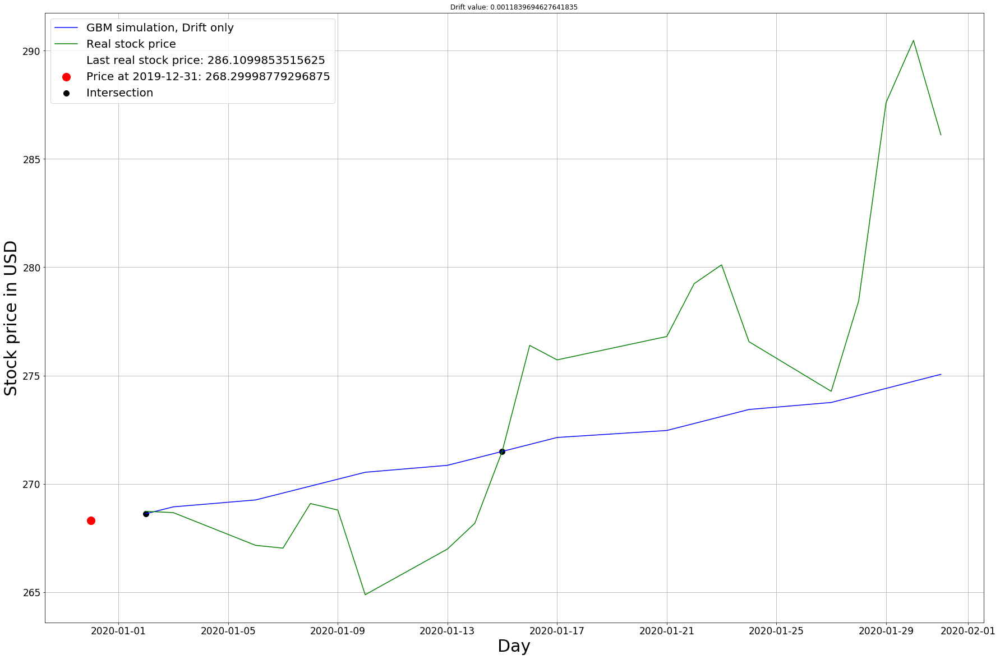

In [36]:
GBM_drift_simulation("FDS", (2019,1,1), (2020,1,1), (2020,1,31), 1)

Lets take a look at the above plot with our Drift component only.

First of, we know that if we keep the same historical data interval, we will always have a constant values of our $\mu$, $\sigma$ and $Drift$. 

We have already stated that the Drift cannot be zero, it is either a positive number or a negative, because of the exponential function in use and we said that if we have a positive drift for example, we would simply expect our stock price to smoothly increase, in a quite preditctive manner.

Well what we see right now is that we have a positive drift, which starting from our last available stock price at 31st of December 2019 smoothly increased our stock price to a price a little higher from 275 USD.

We have also the actual price movement for the first month of 2020, that we are doing a simulation for. We do not have a match for the exact price at 31st of January for example, but we definitely, see that the lines intersect at the middle of the month and overall price movement, which is upwards, is correctly applied from our model. For this particular simulation, no matter on how many simulations we will start, we will always end up with a single line for prediction (it is actually a single thick line as we have n simulations stacked on the some line), as we do not have anything that can change it - for example a random element, our variables in here are constant ones.

We can say that if we would to invest in this stock and checked the stock performance at the end of last year, we will see a BUY sign, as the overall trend for the next month is in incraesing the price. If we would have bought some stocks of this company back in 31st of December 2019 for 268.3 USD, we could sell them for 286.1 USD and making a really good profit, isn't that nice ?

The stock market indicators and the calculations made of them are definitely a powerful weapon in the right hands. Of course we cannot rely on a single simulation to invest all of our savings, but if we can read correctly the indicators and all of the signals, if we can get the right computations, we can make a meaningful results - which will helps us on choosing where we can place our money, if we want to.
The big investors out there in nowadays are not only well educated financial experts, but they are also relying on a heavy algorithmic approach, computating a different scenarios and predictions, which are helping them in determining the right choice.

Let us take a look at another simulation with drift only, but for broader horizon and see whether the direction will be correct again and what will happen overall with the plot. Note that for the current dates range that we are using, we cannot go much further in 2020 year, since we are currently in the mid of April.

<Figure size 432x288 with 0 Axes>

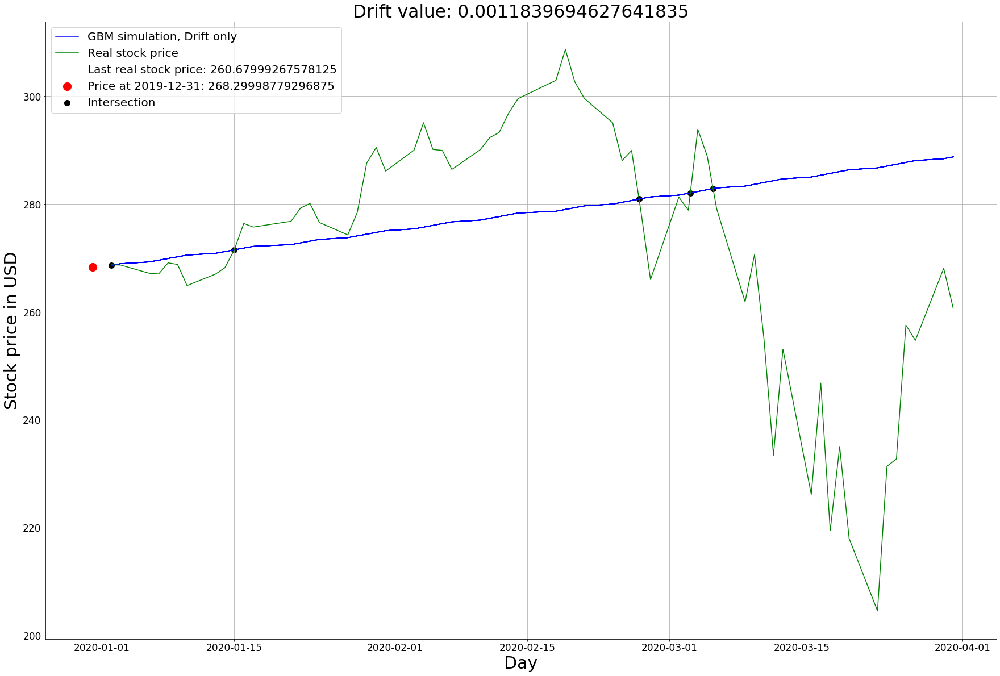

In [37]:
GBM_drift_simulation("FDS", (2019,1,1), (2020,1,1), (2020,3,31), 10)

Again, we see the same constant value of our drift, which means that no matter what happens, we will continue seeing our smooth overall increase on the simulation (the plot coming from our computation).

However we see that this time this is not entirely correct, in fact we see that at the beginning of April our stock price dropped lower than our price at 31st of December 2019, while our simulation line is still increasing. In the future this may become correct again, but we can definitely conclude that depending on our point of prediction, this may give us really different point of views. For some point this may look like something really nice and correct, but for other it appears that the same simulation is not correct at all. Of course we take into consideration the fact that the stock price prediction is something imposible to be done, we are just analyzing our results.

Lets try to do something else, with a different historical interval as well. We would expect to have a different drift from the above one.

We also see that the actual stock price is not present for the last days of the drift line.

<Figure size 432x288 with 0 Axes>

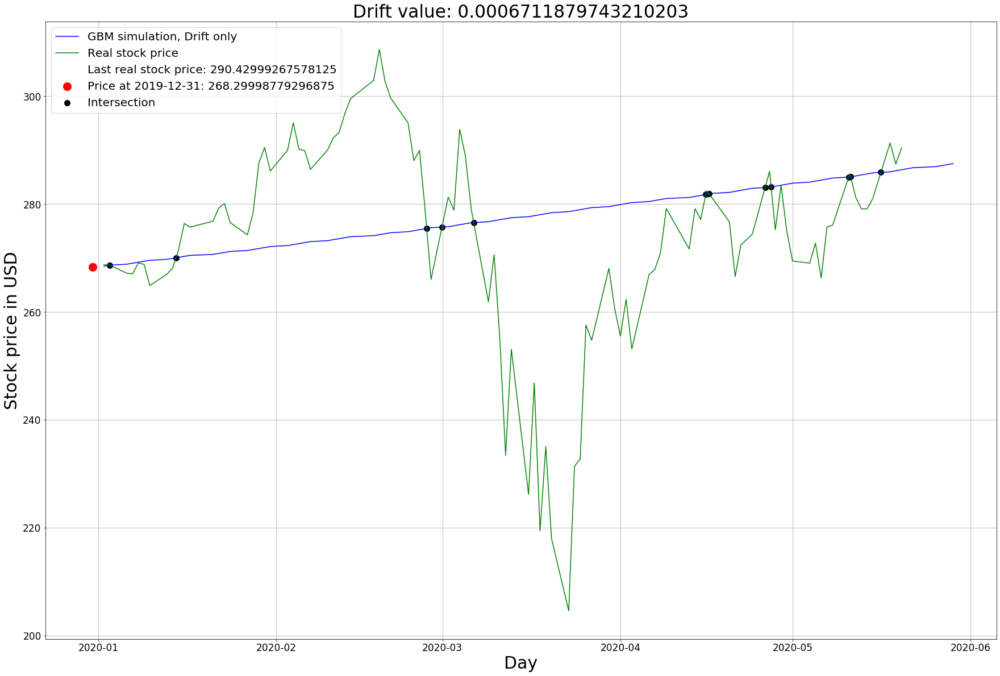

In [38]:
GBM_drift_simulation("FDS", (2018,1,1), (2020,1,1), (2020,5,31), 1)

Here our smooth prediction of increase does not intersect in the future days. However the overall trend of the stock price going upward is something we can say is correctly predicted.

### Wraping it all up

Lets try to build a finalized version for our model now and see how the simulations will look lie.

It is important to state at the beginning that in the real world, whenever someone want to get any valuable information for such models, using random elements, it is usually consider to make as much simulations as possible. Depending on the computational capabilities this can be tens of thousands or even milion simulations, but for this article we cannot go at such number.

In [39]:
def GBM_simulation(stock, historical_data_start, simulation_start_interval, simulation_end_interval, number_of_simulations, confidence=[95, 99], VaR=False, H_VaR=False):
    """
    Description: This is the complete function for the Geometric Brownian Motion simulation.
    The function has all of the sub-functions invoked inside and is doing a complete simulation - drift + diffusion.
    Final plot and results are concentrated on simulation only and not the historical data.
    Intersection function is not being called from this one, since it seems to be not reasonable.
    
    Parameters:
    stock(str) - name of the stock we want to do a simulation for
    historical_data_start(tuple) - format (YYYY,M,D) - start of our historical data, that we will use for reference
    simulation_start_interval(tuple) - format (YYYY,M,D) - start of the simulation interval + end of the historical data interval also
    simulation_end_interval(tuple) - format (YYYY,M,D) - end of the simulation interval
    number_of_simulations(int) - number of simulations computated
    confidence(list) - percent number that will be used for the value at risk representation, default is [95, 99]
    VaR(bool) - set whether the value at risk on the speculated prices will be computed and shown, default is False
    H_VaR(bool) -  set whether the value at risk on the hist. data will be computed and shown, default is False
    
    Return:
    The function does not return anything within this version
    
    """
    
    # From the simulation start interval, we will determine the end date for our historical data.
    # For the purposes of this simulation we will also get a historical begin date 1-January-2019
    
    simulation_start_interval = dt.date(simulation_start_interval[0], simulation_start_interval[1], simulation_start_interval[2])
    simulation_end_interval = dt.date(simulation_end_interval[0], simulation_end_interval[1], simulation_end_interval[2])
    
    # If simulation interval is only future days, the target data is retrieved to the maximum available day
    
    hist_data_start = dt.date(historical_data_start[0], historical_data_start[1], historical_data_start[2])
    hist_data_end = simulation_start_interval
    
    stock_data = web.DataReader(stock,'yahoo', hist_data_start, hist_data_end).reset_index()
    
    NYSE = mcal.get_calendar("NYSE")
    
    # If we use this for testing purposes only, we can check the already available data for the simulation interval
    # Using this data we can plot the stock price at the simulation interval end for comparsion
    
    # Fine tunes a little for cases where our simulation interval will be entirely in the future
    # Upon some testing such situations were giving KeyErros, so handled with this approach, maybe not the best one
    # If the simulation interval is only in future our "current" data will be the last 30 records from the historical one
    # This will leave us with a "current price" later on - the last price from the historical interval
    try:
        current_stock_data = web.DataReader(stock,'yahoo', simulation_start_interval, simulation_end_interval).reset_index()
        current_stock_price = current_stock_data["Close"]
        current_stock_day = current_stock_data["Date"]
    except KeyError:
        current_stock_price = stock_data["Close"].iloc[-10:]
        current_stock_day = stock_data["Date"].iloc[-10:]
        
    # Price from the last day of the historical data
    
    S = stock_data["Close"].iloc[-1]
    last_day = stock_data["Date"].iloc[-1]
    
    # Time unit / increment
    
    dT = len(NYSE.valid_days(stock_data["Date"].iloc[-2], stock_data["Date"].iloc[-1])) - 1
    
    # Interval for the prediction, business days only.
    
    working_days = NYSE.valid_days(simulation_start_interval, simulation_end_interval)
    
    T = len(working_days)
    
    # Number of time point that we get after the time unit and the days of our prediction

    N = T / dT
    
    # Creating array for all of the time point of our prediction
    # This will make further computations easier, since we will have 1 variable for the points
    
    t = np.arange(1, np.int(N) + 1)
    
    # Now lets store the "mu", which will be our expected return.
    # We get this as mean return, based on the historical date interval that we have, 
    # so we need to calculate the return first.

    returns = stock_data["Close"].pct_change()
    mu = np.mean(returns)
    
    # "sigma", which is the standard deviation of our historical returns.
    # We are using Numpy for both the "mu" and "sigma"

    sigma = np.std(returns, ddof=1)
    
    
    # Here we will create an array, that will store our random variable.
    # All of the predictions are following the same pattern. Predictions coming as input parameter.
    # We will create as much random elements as we need for every simulation
    # For every simulation we will create random elements for every time point
    # We will store the initial random elements in a dictionary for every simulation
    
    random_element = dict()
    
    
    for simulation in range(1, number_of_simulations + 1):
        random_element[f"Simulation: {simulation}"] = np.random.normal(0, 1, int(N))
    
        # We will also calculate the path itself in here as well
        
        random_element[f"Simulation: {simulation}"] = random_element[f"Simulation: {simulation}"].cumsum()
    
    
    # Calculate the Drift
    # The result will be stored in a list again, for every time point
    
    drift = (mu - (0.5 * np.power(sigma, 2))) * t
    
    # Calculate the Diffusion
    diffusion = dict()
    
    for simulation in range(1, number_of_simulations + 1):
        diffusion[f"Simulation: {simulation}"] = sigma * random_element[f"Simulation: {simulation}"] 

    # Wrap it all up in for the simulation
    
    GBM = []
    
    for simulation in range(1, number_of_simulations + 1):
        GBM.append(S * np.exp(drift + diffusion[f"Simulation: {simulation}"]))

    simulation_min = min([min(G) for G in GBM])
    simulation_max = max([max(G) for G in GBM])
    
    # Plot the simulation
    
    plt.clf()
    plt.figure(figsize=(30, 20))

    for simulation in range(number_of_simulations):
        if simulation == 0:
            plt.plot(working_days, GBM[simulation], label=f"GBM Simulation", zorder=1)
        else:
            plt.plot(working_days, GBM[simulation], zorder=1)

    plt.xlabel('Day', fontsize=30)
    plt.grid()
    plt.ylabel('Stock Prices, USD', fontsize=30)
    plt.title(f"Geometric Brownian Motion simulation for {stock} from {simulation_start_interval} to {simulation_end_interval}")
#     plt.rcParams.update({'font.size': 30})   
    plt.tick_params(labelsize=18)  # Optional one, can be adjusted
    plt.scatter(last_day, S, c="r", s=200, label=f"Price at {last_day.date()}", zorder=2)
    plt.scatter(current_stock_day, current_stock_price, c="black", s=80, label=f"Real stock price", zorder=3)
    plt.plot([], [], ' ', label=f"Simulation max: {simulation_max}")
    plt.plot([], [], ' ', label=f"Simulation min: {simulation_min}")
    plt.legend(loc="upper left", fontsize=34, prop={"size": 20})
    
    plt.show()
    
    # Boolean check which decide whether there will be VaR computed or not.
    
    if VaR:
        calculate_var(GBM, current_stock_price.iloc[-1], confidence)
    if H_VaR:
        calculate_historical_var(returns, mu, sigma, current_stock_price.iloc[-1], confidence)

<Figure size 432x288 with 0 Axes>

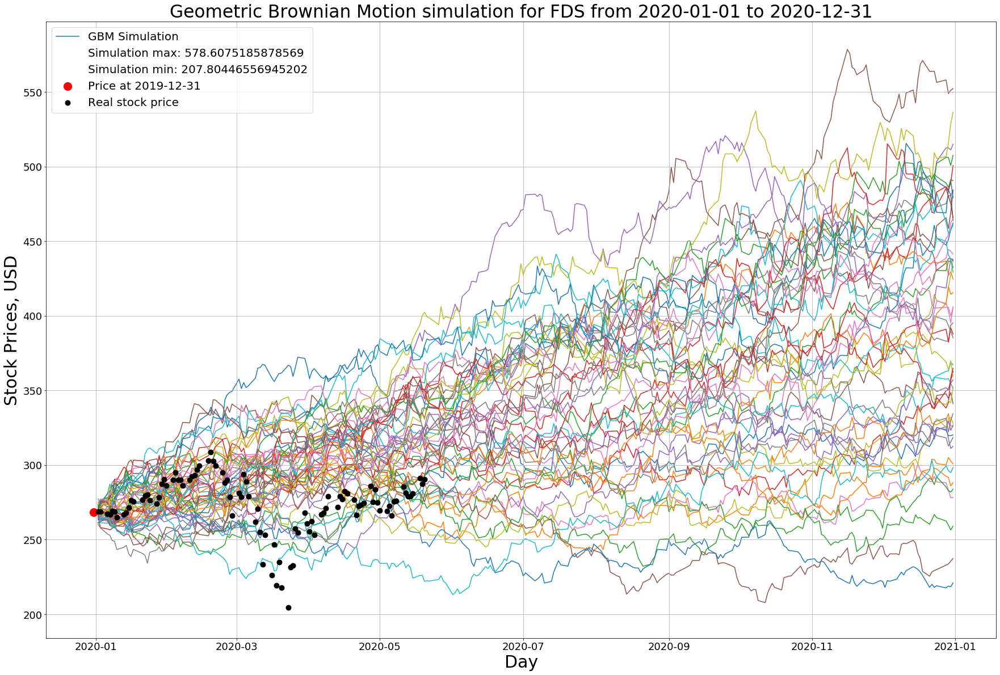

In [40]:
GBM_simulation("FDS", (2019,1,1), (2020,1,1), (2020,12,31), 50)

We can definitely see that for the full simulation the plot looks different, we have a lot of simulations, but we can start it with only one as well. For our approach we actually do pick a simulation interval, for which we see the fluctations of our speculated stock price for the period, separately we are choosing the number of simulations we will start. The first plot is with 50 simulations only, but usually the more the better, so we can try to start this with 100-200 or even more in the next speculations we will do.

On the plot we have the simulation maximum and minimum values + the actual stock price for the simulation period - if the same is available. With these - we can actually do a direct comparsion and see whether we have a match for some real stock price and our speculated one, in fact we can even see how many times we have matched all of the real prices. If we have the capabilities of doing 100 000 simulations, we can definitely see a lot of matches.

<Figure size 432x288 with 0 Axes>

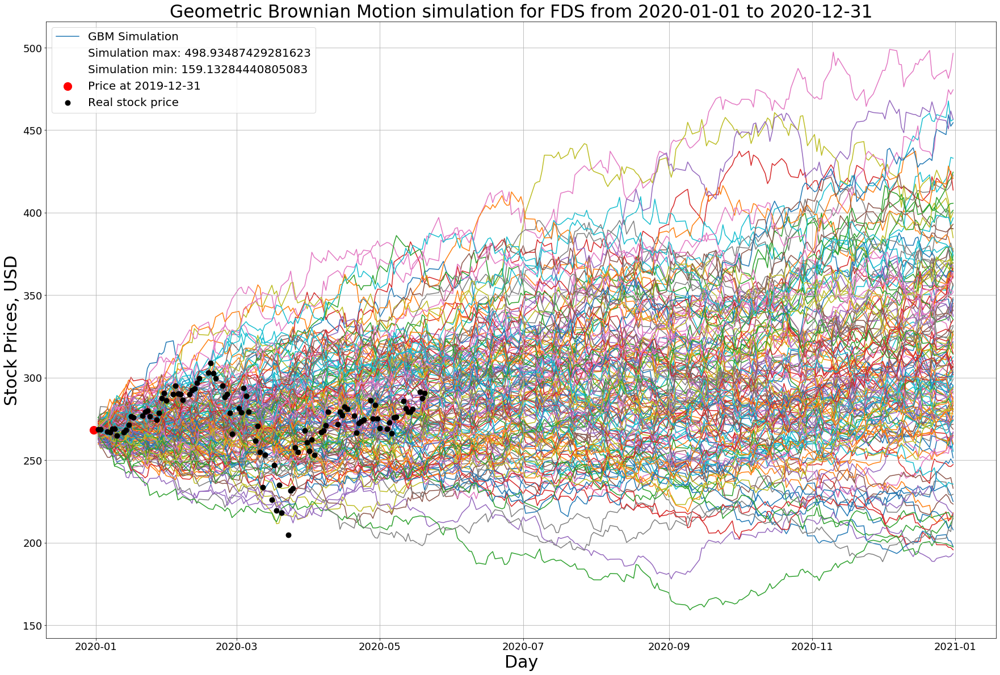

In [41]:
GBM_simulation("FDS", (2015,1,1), (2020,1,1), (2020,12,31), 150)

Here is a different perspective simulation. We can use the function to extract more historical data and also predict a broader horizon again. On this plot we see a simulation interval for the whole 2020 year and as you see we do not have the current stock price - lets say for May, June and so on till December.

With looking at all of lines when we have 150 simulations, it really does not seems to be intuitive to go for following every single one of them. What we can confirm on the other hand is that for all of the real stock prices - we do have an intersection for some lines from our simulation.

For sure we can spend a lot of time playing and looking into the different colorful plots that we can get with this function, but at the end of the day - in real life and in the simulations we are doing in this article - it is really important to extract some information from the executions. Of course we must not underestimate the simulations themselves! We are basically right now able to simulate as many different scenarios as we want and if we want to, we can try to find patterns in the different paths every time and eventually decide what to do with our investment. For instance, if you invest in any stock and your assumption based on some simulations is that the price will go higher in the next quarter, you can make a lot of money. Its up to everyone to decide whether it is fine to get a graphical interpretation for the different stock price moved for something relevant or not. To me trying to predict the future while also comparing our attempts for these predictions with the historical data seems really meaningful is not bad at all!

In the finance world nowadays the algorithmic comuputations, simulations and even trading is playing a major role, in fact some experts doubt that in the recent years most of the shakes on the stock market are because of the computers and not the humans. Having that said, it makes sense to thinkg and research about all of the applications of any simulation even if it is using some random elements. For sure we cannot spend the time to review on all of the appropriate applications, but we can definitely take a look in details and implement one really important one and that is how to estimate and what actually is value at risk - VaR.

### 6. Extending the simulation with VaR calculation

First lets start with giving some light on what actually value at risk does mean.

VaR was developed in mid-1990s, in response to the various financial crisis, but the origins of the measures lie further back in time. The  definition implies that it is necessary to choose two parameters, namely holding period and confidence level. Typically the confidence level lies in the range 90% to 99% such as 90%, 95%, 99%. Holding period may vary from a day to a year.

Suppose, an analyst says that the 1-day VaR of a portfolio (it could consist with a single stock inside like in our case of simulation to one stock only) is 1 million dollar, with a 95% confidence level. It implies there is 95% chance that the maximum losses will not exceed 1 million dollar in a single day. In other words, there is only 5% chance that the portfolio losses on a particular day will be greater than 1 million dollar. For investors, the risk is about the odds of losing money, and VAR is based on that common-sense fact. By assuming investors care about the odds of a really big loss, VAR answers the question, "What is my worst-case scenario?" or "How much could I lose in a really bad month?"

Now let's get specific. A VAR statistic has three components: a time period, a confidence level and a loss amount (or loss percentage). Keep these three parts in mind as we give some examples of variations of the question that VAR answers:

    -What is the most I can - with a 95% or 99% level of confidence - expect to lose in dollars over the next month?
    
    
    -What is the maximum percentage I can - with 95% or 99% confidence - expect to lose over the next year?
    You can see how the "VAR question" has three elements: a relatively high level of confidence (typically either 95% or 99%), a time period (a day, a month or a year) and an estimate of investment loss (expressed either in dollar or percentage terms).
    
    

There are different methods on how you can estimate and calculate the value at risk, you can rely on both only historical data available or some simulated one - with a model that you find working and suitable. As you may guess, we will aim to integrate a VaR calculation function into our main function, so that we will be able to gather this number from our simulation and not from the historical data only.


Before focusing on the approach that we are going to use, lets first do some quick histogram plots, just to get used looking at them. These will be included into our main function for the VaR part and will be something expected to see at some point, so lets quickly review them.

In [42]:
# Lets gather some data with the same methods we have used in the beginning

start = dt.datetime(2015,1,1)
end = dt.datetime(2019,12,31)

stock_ticker = "FDS"

stock_data = web.DataReader(stock_ticker,'yahoo', start, end).reset_index()

In [43]:
# Again we will need some data and values we are already aware of and know how to extract:
#  - closing price, mean return, standard deviation

price = stock_data["Close"]
returns = price.pct_change().dropna()
mean = np.mean(returns)
std_deviation = np.std(returns, ddof=1)

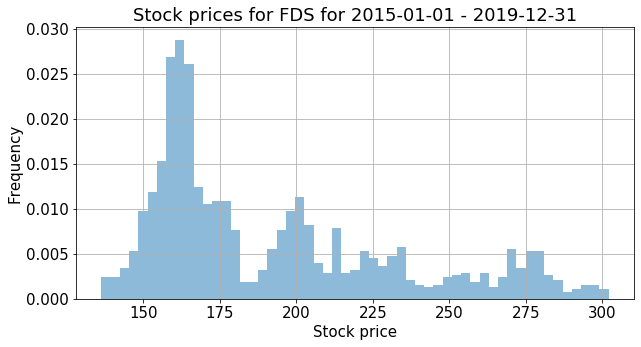

In [63]:
# No fancy details added, this is only our stock price.

plt.rcParams.update({'font.size': 15})
plt.figure(figsize=(10, 5))
plt.hist(price, bins=55, density=True, alpha=0.5) # density turns the result in a percent Like format (%)
plt.grid(True)
plt.xlabel("Stock price")
plt.ylabel("Frequency")
plt.title(f"Stock prices for {stock_ticker} for {start.date()} - {end.date()}")
plt.show()

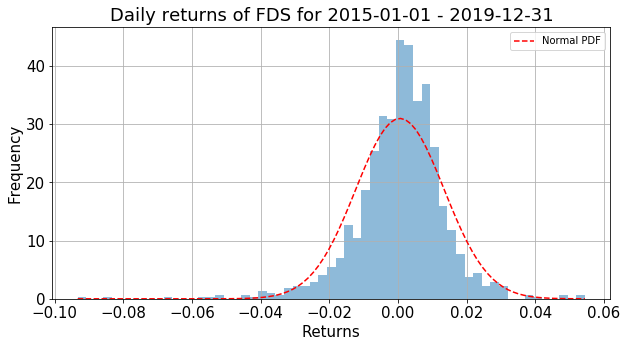

In [73]:
# Histogram on the daily change of our stock price (returns) based on the historical data
# Using the scipy.stats.norm.pdf to simply plot the normal distribution with the mean and standard deviation given

plt.rcParams.update({'font.size': 15})
plt.figure(figsize=(10, 5))
plt.hist(returns, bins="fd", density=True, alpha=0.5)
x = np.linspace(returns.min(), returns.max(), 100)
plt.plot(x, scipy.stats.norm.pdf(x, mean, std_deviation), "r--", label="Normal PDF")
plt.grid(True)
plt.title(f"Daily returns of {stock_ticker} for {start.date()} - {end.date()}")
plt.xlabel("Returns")
plt.ylabel("Frequency")
plt.legend(fontsize=15, prop={"size": 10})
plt.show()

The above one - first histogram based on the returns is also showing us the fit of the probability density function (PDF) from the normal distribution package and it is looking really well. The PDF is used to specify the probability of the random variable falling within a particular range of values, as opposed to taking on any one value. This probability is given by the integral of this variable's PDF over that range—that is, it is given by the area under the density function but above the horizontal axis and between the lowest and greatest values of the range. The probability density function is nonnegative everywhere, and its integral over the entire space is equal to 1, in general the PDF is used in teh context of continuous random variables.

Moving a little bit further with the returns histogram, with the power that Python libraries give us, we can try to visualize another distribution in addition to the first one (based on returns), coming from the T-statistics and decide whether it will fit better for this type of data.

Lets try to plot the so called Student's t-distribution, or simply the t-distribution.

The t-distribution is symmetric and bell-shaped, like the normal distribution, but has heavier tails, meaning that it is more prone to producing values that fall far from its mean. This makes it useful for understanding the statistical behavior of certain types of ratios of random quantities, in which variation in the denominator is amplified and may produce outlying values when the denominator of the ratio falls close to zero.


There is a lot to talk about on the PDF itself and the different stastics packages available in Python. However since working with almost everything in Python is easy as ...py, we will not go into a detailed explanation on all of the specifics, I consider the information available around the net really well descriptive and having that said, I want to put one great example coming directly from the Wikipedia page for [Probability density function](https://en.wikipedia.org/wiki/Probability_density_function) 



Example:


Suppose bacteria of a certain species typically live 4 to 6 hours. The probability that a bacterium lives exactly 5 hours is equal to zero. A lot of bacteria live for approximately 5 hours, but there is no chance that any given bacterium dies at exactly 5.0000000000... hours. However, the probability that the bacterium dies between 5 hours and 5.01 hours is quantifiable. Suppose the answer is 0.02 (i.e., 2%). Then, the probability that the bacterium dies between 5 hours and 5.001 hours should be about 0.002, since this time interval is one-tenth as long as the previous. The probability that the bacterium dies between 5 hours and 5.0001 hours should be about 0.0002, and so on.

In these three examples, the ratio (probability of dying during an interval) / (duration of the interval) is approximately constant, and equal to 2 per hour (or 2 hour−1). For example, there is 0.02 probability of dying in the 0.01-hour interval between 5 and 5.01 hours, and (0.02 probability / 0.01 hours) = 2 hour−1. This quantity 2 hour−1 is called the probability density for dying at around 5 hours. Therefore, the probability that the bacterium dies at 5 hours can be written as (2 hour−1) dt. This is the probability that the bacterium dies within an infinitesimal window of time around 5 hours, where dt is the duration of this window. For example, the probability that it lives longer than 5 hours, but shorter than (5 hours + 1 nanosecond), is (2 hour−1)×(1 nanosecond) ≈ 6×10−13 (using the unit conversion 3.6×1012 nanoseconds = 1 hour).

There is a probability density function f with f(5 hours) = 2 hour−1. The integral of f over any window of time (not only infinitesimal windows but also large windows) is the probability that the bacterium dies in that window.



Another thing that I think is really nice to have in this article, even if it is only for comparison reasons. Let us show two different math formulas for the  probability density function coming from the normal distribution package and from the Stundet's one.

---                       

Normal distribution:   $$\frac{1}{\sigma \sqrt{2 \pi}} e^{-\frac{1}{2} (\frac{x - \mu}{\sigma})^{2}}$$

---

Student's t-distribution:   $$\frac{\Gamma (\frac{\nu + 1}{2})}{\sqrt{\nu \pi} \Gamma (\frac{\nu}{2})} (1 + \frac{x^2}{\nu})^{-\frac{\nu + 1}{2}}$$

---

Quite different, but still let see the Student's one

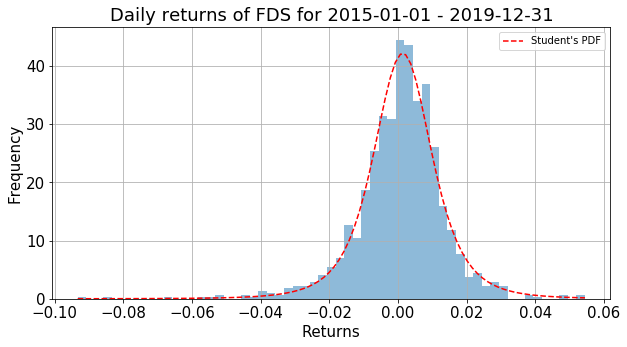

In [72]:
# Histogram on the daily change of our stock price (returns) based on the historical data
# Using the scipy.stats.norm.pdf to simply plot the normal distribution with the mean and standard deviation give

plt.rcParams.update({'font.size': 15})
plt.figure(figsize=(10, 5))
base = np.linspace(returns.min(), returns.max(), 100)
tdf, tmean, tstd_deviation = scipy.stats.t.fit(returns)
plt.hist(returns, bins="fd", density=True, alpha=0.5)
plt.plot(base, scipy.stats.t.pdf(base, loc=tmean, scale=tstd_deviation, df=tdf), "r--", label="Student's PDF")
plt.grid(True)
plt.title(f"Daily returns of {stock_ticker} for {start.date()} - {end.date()}")
plt.xlabel("Returns")
plt.ylabel("Frequency")
plt.legend(fontsize=15, prop={"size": 10})
plt.show()

Without doubt, the Student's PDF looks to fit the returns we have at the moment better. Assuming that this will fit better in our simulation data as well, we will try to use it in the future function that we will implement and plot in the final result.

The above illustration looks really bell curved and is definitely being concentrated around the zero. This is not a coincidence actually, because our returns are basically our daily change based on the historical stock price we have, so it is not really common to see a stock price to fluctate with 10% on a daily basis. A simple example not requiring any financial background is - we have the Tesla stock price (quite popular in the recent months) with a current stock price arround 750 USD. Does it seems normal to have this stock changing from one day to another with 50-100 USD ? Well it is definitely possible, but that is not something common. One can easily ensure on this by checking on google on any stock price movement chart.


We can also keep this in mind, as we can actually calculate the returns, mean and standard deviation of our simulation data and do a prediction histogram for it as well.

One way of estimating a value at risk based on our returns is to get the mean and standard deviation and then calculating the VaR using point percentile function.

In [47]:
# "scipy.stats.norm.ppf" is giving us the method for percent point function, which is also another name of Quantile function
# the quantile function specifies the value of the random variable,
# such that the probability of the variable being less than or equal to that value equals the given probability
# default mean and std are mean=0, std=1 which is the "standard" normal distribution
# we can specify our own mean and std, based on the calculatd ones from the returns we have


scipy.stats.norm.ppf(0.01, mean, std_deviation)

-0.02935848610761312

##### Our theoretical calculation for 0.01 is giving us approx. "-0.02934", which means that with 99% confidence, the worst daily loss will not exceed  2.934%



Calculating VaR based on the returns is really useful in real life, when an investor has a portfolio with multiple of financial instruments (stocks or other equties) and want to estimate his worst scenarios based on an investment he has. So for example if one has an investment of 1 million USD and has a one-day VaR similar to the above example, he can estimate the VaR amount based on his investment:

0.02934 * 1M USD = 29340 USD



Our final touch now will be to extract some value / price at risk with a given confidence level, based on the simulations that we have. In other words - if we start 100 simulations - we can use the data from the simulations to group the lowest / highest prices. For example, assuming we want the VaR with a 99% confidence interval, we can start with ordering our prices from lowest to highest. Then we read the 1% lowest percentile in this series, these means that there is a 1% chance that the current stock price could fall to these prices or less over the period that we are observing. Of course this is not guaranteed, as the market conditions can change within a seconds, this is only estimation based on some simulated stock price paths.

We can also use these with the current stock price that we have, for example if these 1% numbers are lower than the current stock price (which will be probably true), that means the current stock price - 1% number will be a loss and this loss represents the VaR with a 99% confidence level.


In [48]:
# numpy percentile method is used to give us a number,
# that describes the value that a given percent of the values are lower than
# for the percentile method we explicitly define the percent we want as a second parameter

var_prices = stock_data["Close"]
var = np.percentile(var_prices, 1)
test_current_price = stock_data["Close"].iloc[-1]
final_var = test_current_price - var

In [49]:
# "var" with the below value means that 1% of the stock prices in our array are 140,123...  or lower
# the same can be examined with different percents as well

var

140.13539520263672

In [50]:
# this is the final price, assuming our last price in the historical data is the current stock price
# current_stock_price - var

final_var

128.16459259033203

The above approach is quite simple and really suitable to apply on our simulated prices, because it is giving us a direct single number, we can either apply this on the full list of prices that we have and get a number, or apply it on every single simulation and see the values at risk for every simulation and then building some kind of an interval based on them.

So lets try to implement a function now, that will calculate VaR on some stock data given, no matter if it is a historical one or one coming from our simulated, we will later on use it in our main GBM function, to give a final look on the predictions we are starting.

One thing that matter here, for the integration into our main function is that it will be not appropriate to go with a returns VaR approach. The reason is clear - we will have multiple path for the time points in topic and each one of them will have different percent changes on a daily basis, different mean, different standard deviation, etc. So if that is looking this way, which one should be pick ? We will need to go with some kind of estimation and mean values, which will not be really suitable or give us information to rely on. Therefore we will follow a more common approach which is applied for different simulations with stock prices and random variables - to work with all of the stock prices generated - giving us a broad range of paths and estimating the worst scenarios based on all of them.

In [81]:
def calculate_var(stock_prices, curr_stock_price, confidence):
    stacked_prices = np.hstack(stock_prices)
    simulation_days = len(stock_prices)
    simulation_prices = len(stacked_prices)
    print("\n\n#--------------VaR based on stock prices from the GBM simulation-----------#",)
    print(f"#--------------Number of simulations - {simulation_days}-----------#")
    print(f"#--------------Total number of prices from the simulation - {simulation_prices}-----------#\n\n")
        
    for c in [100 - x for x in confidence]:
        print(f"#--------------Price distribution and VaR at {100-c}% confidence level-----------#")
        var = np.percentile(stacked_prices, c)
        lower_than_var = len(stacked_prices[stacked_prices <= var])
        print(colored(f"Current stock price: {curr_stock_price}", "red"))
        print(colored(f"{c}% of the prices are <=  {var}", "red"))
        print(colored(f"VaR ({100-c}%): {curr_stock_price - var}", "red"))
        print(colored(f"From {simulation_days} simulations, the probability for the price to go {var} or lower is:  {lower_than_var / simulation_prices}", "red"))
        plt.figure(figsize=(10, 7.5))
        plt.tick_params(labelsize=18)  # Optional one, can be adjusted
        plt.hist(stacked_prices, density=True, bins=50, histtype="stepfilled", alpha=0.5)
        plt.axvline(x=var, color="r", linestyle="--", label=f"Price for confidence {100 - c}% - {var}")
        plt.plot([], [], ' ', label=f"VaR({100-c}%) - {curr_stock_price - var}")
        plt.title(f"Price distribution and VaR at {100-c}% confidence level")
        plt.xlabel("Stock Price")
        plt.ylabel("Probability")
        plt.legend(fontsize=15, prop={"size": 10})
        plt.grid()
        plt.show()
    

<Figure size 432x288 with 0 Axes>

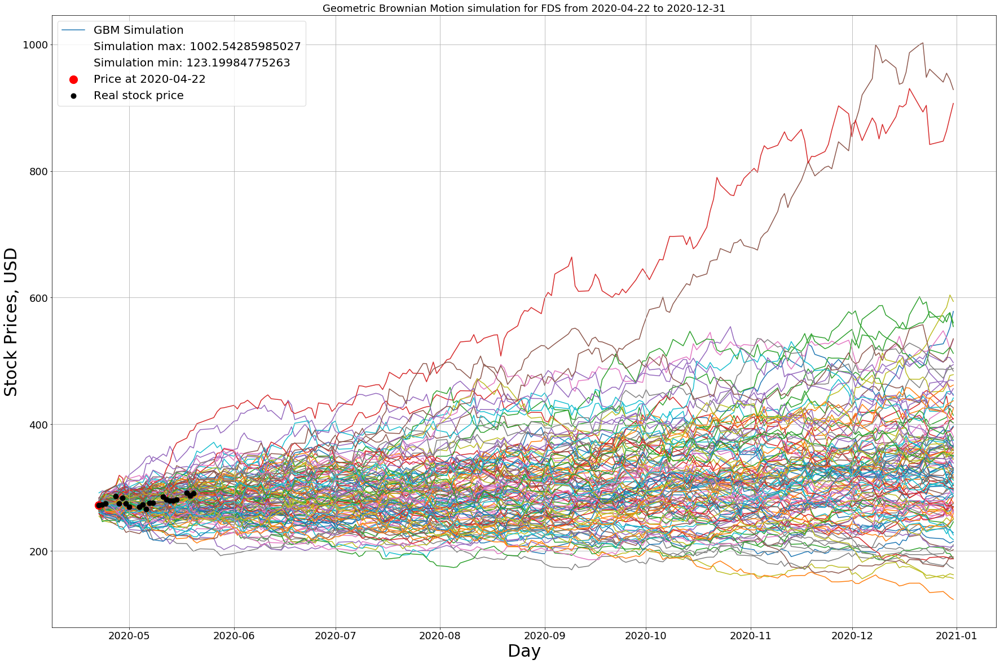



#--------------VaR based on stock prices from the GBM simulation-----------#
#--------------Number of simulations - 120-----------#
#--------------Total number of prices from the simulation - 21240-----------#


#--------------Price distribution and VaR at 90% confidence level-----------#
Current stock price: 290.9100036621094
10% of the prices are <=  230.82441322035953
VaR (90%): 60.085590441749844
From 120 simulations, the probability for the price to go 230.82441322035953 or lower is:  0.1


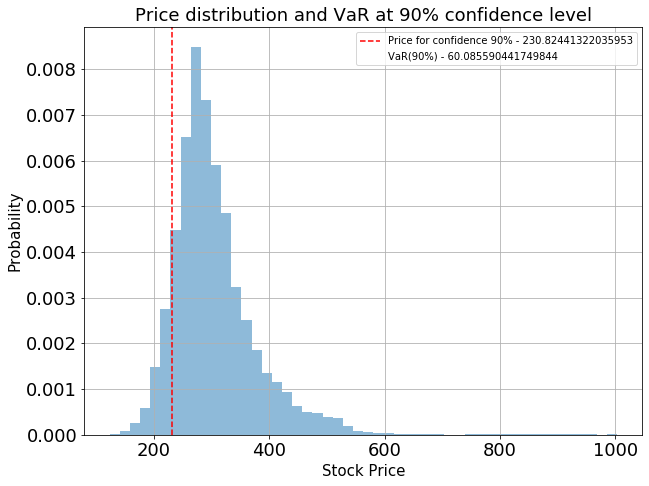

#--------------Price distribution and VaR at 95% confidence level-----------#
Current stock price: 290.9100036621094
5% of the prices are <=  214.9915574601269
VaR (95%): 75.91844620198248
From 120 simulations, the probability for the price to go 214.9915574601269 or lower is:  0.05


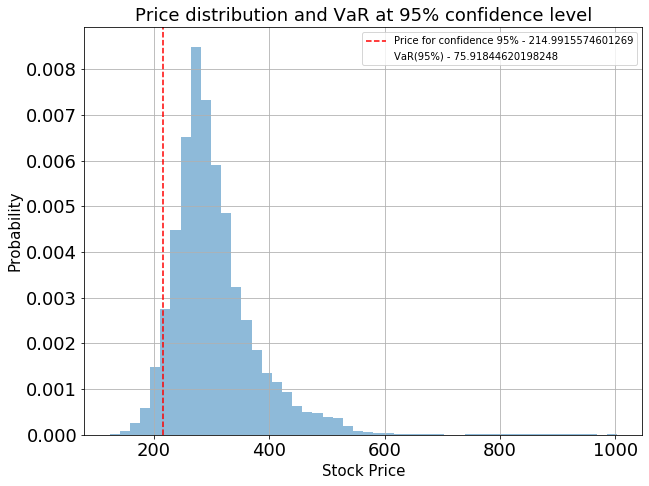

#--------------Price distribution and VaR at 99% confidence level-----------#
Current stock price: 290.9100036621094
1% of the prices are <=  186.2471511222589
VaR (99%): 104.66285253985046
From 120 simulations, the probability for the price to go 186.2471511222589 or lower is:  0.01002824858757062


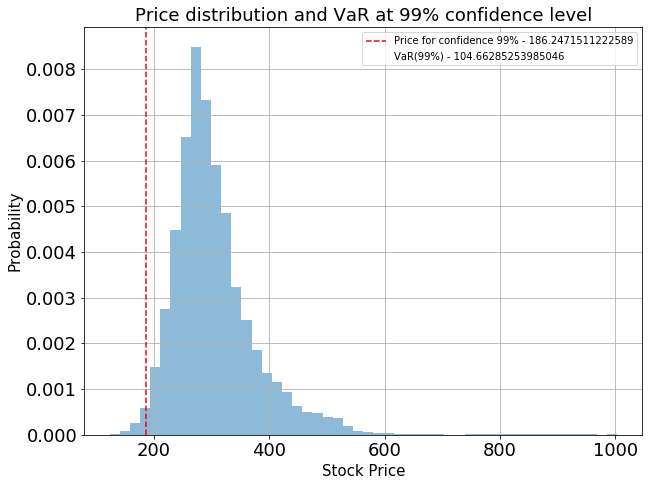

In [82]:
GBM_simulation("FDS", (2019,1,1), (2020,4,22), (2020,12,31), 120, confidence=[90, 95, 99], VaR=True)

The above function was integrated in the "GBM_simulation" main function with some additional (optional) parameters when starting, if we have "VaR = True", we will calculate and present the value / price at risk, based on our simulation and on the last current stock price that we have from the actual data.

We can also specify a different amount of confidence levels, for the first one, we have started this with confidence levels of 90, 95, 99, but this can vary depending on the needs.


As mentioned earlier, when describing the VaR approaches and how we can integrate them into our function to serve best for our simulation, I think it is clear that calculating the returns VaR for every single one of our simulated paths will not be a nice one - we need to do some mean values or plot hundrends of histograms for every single one of them.

What we can do on the other hand is, to include a VaR estimation on the historical data we have. This seems to be a really elegant approach, as we are giving our simulation interval + historical data interval. At the end of our simulation we will have all of our paths + the VaR of the returns based on the historical data + the VaR of the prices coming from all of the paths in our simulation.

Lets try to implement the above idea into a separate function that we will integrate in the main one as well. Since it is again for the VaR calculation, we will keep it under the main condition of whether we have VaR parameter of True or False.

We will also use the approach with the mean and standard deviation calculated on our historical returns. Moreover, when we invoke this function from our main one, we will actually have pre-calculated already the returns, mu and sigma and that is simply all we need.

The approach of using mean and standard deviation pre-calculated based on some returns is called Variance-Covariance and is quite popular. Of course there are different methods as well, like calculating directly from the returns themselves - similar to what we are doing with the prices. As of now we won't review all of the methods, but offlne testing for large enough interval do not have significant differneces, its just that we pick the Variance-Covariance for this article.

Also for a better representation, I think it will be best if we have 2 not identical methods for the VaRs on the stock prices and returns, this one will probably become more clear with the final tests and presentations and when looking at the final numbers.

In [78]:
def calculate_historical_var(var_returns, var_mu, var_sigma, curr_stock_price, confidence):
    
    print("\n\n#--------------VaR based on the returns from historical data-----------#\n\n")

    plt.figure(figsize=(15, 7.5))
    plt.tick_params(labelsize=18)  # Optional one, can be adjusted
    base = np.linspace(var_returns.min(), var_returns.max(), 100)
    tdf, tmu, tsigma = scipy.stats.t.fit(var_returns.dropna())
    plt.hist(var_returns, bins=50, density=True, histtype="stepfilled", alpha=0.5, color="lightgreen")
    plt.plot(base, scipy.stats.t.pdf(base, loc=tmu, scale=tsigma, df=tdf), "r--", label="Student's PDF")
    plt.title(f"Returns distribution and Student's PDF fit")
    plt.xlabel("Daily change")
    plt.ylabel("Probability")
    plt.legend(loc="upper right", fontsize=15, prop={"size": 10})
    plt.grid()
    
    colors = ["purple", "orange", "blue"]
    
    for c, color in zip([(100 - x)*0.01 for x in confidence], colors):
        var = scipy.stats.norm.ppf(c, var_mu, var_sigma)
        display_var = "%.5f"% var # Set lower decimal point precision for pretier plot
        plt.axvline(x=var, c=color, label=f"Theoretical quantile for confidence  {(10-c)*10} is:  {display_var}")
        print("#-------------------------------------------------#")
        print(f"Current stock price: {curr_stock_price}")
        print(f"VaR at {100-(c / 0.01)}%")
        print(f"Theoretical quantile with  {c}: {var}")
        print(f"With {100-(c / 0.01)}% confidence, worst daily loss will not exceed {abs(var * 100)}%")
        print(f"One-day Value at Risk for the current stock price: {abs(var * curr_stock_price)}\n\n")
    plt.legend(loc="upper right", fontsize=15, prop={"size": 10})

<Figure size 432x288 with 0 Axes>

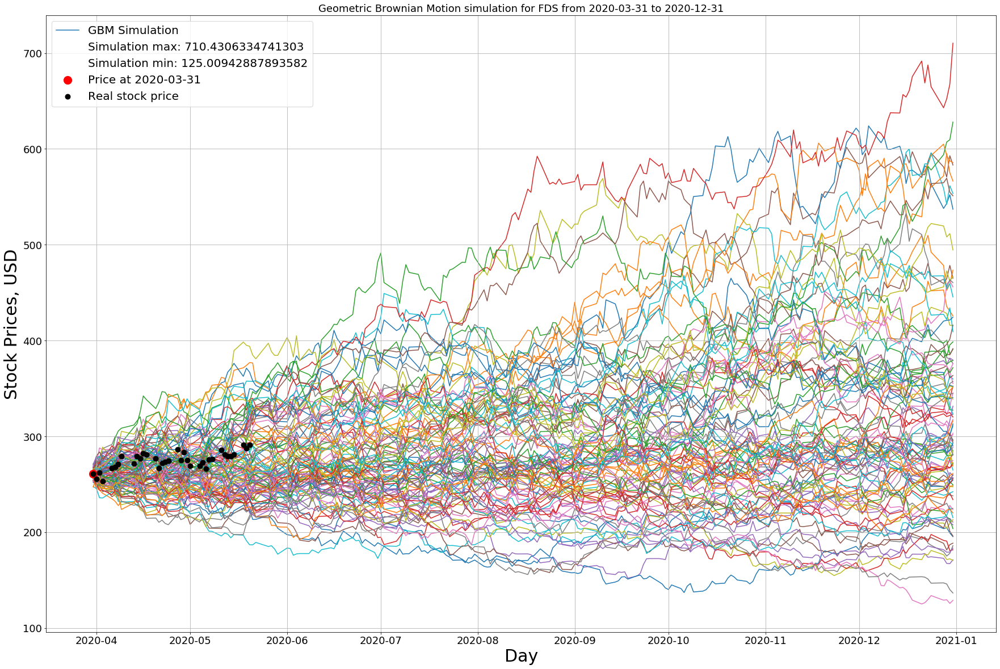



#--------------VaR based on the returns from historical data-----------#


#-------------------------------------------------#
Current stock price: 290.9100036621094
VaR at 90.0%
Theoretical quantile with  0.1: -0.028586235842044484
With 90.0% confidence, worst daily loss will not exceed 2.8586235842044485%
One-day Value at Risk for the current stock price: 8.316021973495083


#-------------------------------------------------#
Current stock price: 290.9100036621094
VaR at 95.0%
Theoretical quantile with  0.05: -0.03700895026848979
With 95.0% confidence, worst daily loss will not exceed 3.700895026848979%
One-day Value at Risk for the current stock price: 10.76627385813719


#-------------------------------------------------#
Current stock price: 290.9100036621094
VaR at 99.0%
Theoretical quantile with  0.01: -0.05280856176607135
With 99.0% confidence, worst daily loss will not exceed 5.280856176607135%
One-day Value at Risk for the current stock price: 15.362538896758545




C:\Users\ptsvetkov\AppData\Local\Continuum\anaconda3\lib\site-packages\numpy\lib\histograms.py:824: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
C:\Users\ptsvetkov\AppData\Local\Continuum\anaconda3\lib\site-packages\numpy\lib\histograms.py:825: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


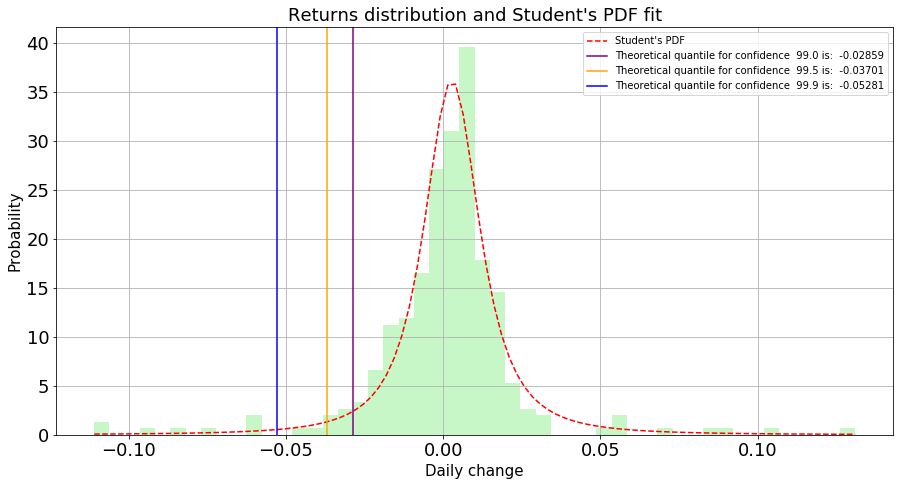

In [79]:
GBM_simulation("FDS", (2019,1,1), (2020,3,31), (2020,12,31), 100, confidence=[90, 95, 99], H_VaR=True)

OK, so lets try to say something about the last 2 functions.

We have implemented 2 type of really simple VaR calculations (please note that these are not said to be 100% accurate calculations of VaR, in the real world there are for sure a lot more complicated and precise ones) - one that is working with all of the speculated stock prices we have for the future and another one that is using our specified historical interval data for the stock.

Both of the solutions have a common purpose actually and that is to give some kind of estimation on what could be the worst day for an investor lets say. Trying the "GBM_simulation" function a couple of times with the 2 VaRs independent, we can definitely spot a difference, a difference that will become even clear when we start the complete version of our function in after a couple of lines from now.

If we pick a single stock to play with + a historical interval beginning and simulation interval, we will actually always come up with the exact same VaR based on the historical returs from our data. The reason for this is quite clear I think - we are using only historical data and nothing else, so the VaR numbers about these will probably become more accurate if we extend our historical interval. The daily percent changes really can vary not only from day to day, but on an year basis as well, if we have returns for a single year and the company we are looking at is publick since 30 years - well that is probably not the best we can do. Ultimately we would want to have some kind of VaR calculated based on ALL of historical information that is currently present for the selected stock. Of course if we would to do investing at a proffesional level, we would probably have to afford some budget for powerful enough machine that can gather and do these for us. Even though these are calculated numbers based on the past, we can still use them to perform some checking on the current stock price and how we would invest, or even do some comparsion based on them for our speculated stock prices from the simulation, which are in the future and yes - like a magic right now we are playing with the past and the future together. Having that said let us say something about the so called future and our other type of VaR, I think it is at least as interesting as this one, for the importance - will leave that to you.

We are seeing also the VaR calculated based on our simulation final results, so what to they mean and how are they different to the other ones coming from the historical data. First off, for this VaR we are using stock prices themselves and not the returns based on them. The reason for this was already quickly mentioned, but just to repeat, if we have 10 000 simulations, it does not make sense to mix all of the prices for the same days, but it also does not make sense to have 10 000 plots and different VaRs isn't it ? What we do on the other hand is to pack all of the single prices from our simulation interval - if we have 100 simulations for an interval of 10 business days this would mean we will have in total $10*100=1000$ singel prices. Of course with 10 business days only and 1000 prices, as the [Pigeonhole principle](https://en.wikipedia.org/wiki/Pigeonhole_principle) states - we are for sure having at least one of the days with more than 1 price - at this particular case we have all of the days with equal count of stock prices - that is simply our approach. For estimating returns VaR this is not really well suited, but for estimating VaR based on our prices this is really good. Lets say we start 100 simulations - this means that we will have 100 different paths that our stock price can take. Combining all of these paths prices into one large set means that we can estimate a total VaR - that will eventuall give us our words day number of no matter situation we are at, some of the paths are even covering prices close the some that would be in a global recession, some other paths cover situations where the stock price is unrealistically expensive, but that is all possible at the stock market.

Both of the VaR type calculations are estimating a price at risk, based on the so called current stock price - this is the last real price we have at the moment of our simulation start. That repsecitvely means that we are coming up with numbers in a selected currency, that are giving us an eventual expected loss with a selected confidence level. Both of the methods will probably give a different prices at risk, but let us not forget on how are they computed and also we are using quite simple final VaR calculation - we are just removing the price at risk from our current stock price and thats all.

About the confidence intervals themselves, it is normal that we would see higher number for the higher confidence levels. If we take 99% confidence, we will actually aim to get that 1% that could be probably reached in the context of price or daily return.

### 7. Final result

Lets now try to put our main function and analysis on a test and try to answer the question we have asked at the beginning - "Howe can we benefit from a random element?"

Here are some tips and things to take into consideration for the use of our function:

    - We have introuduced a couple of functions which are all packed up and finalized in - "GBM_simulation".
    - One must note that if the semi-functions are used they can have some miss-functionalities.
    - The main function is working with simulation interval starting from the past + simulation interval entirely in future.
    - All of the parameters that are to be gived for the functions are described or commented in the functions.
    - There are no decent performance testing metrics, since this can be started on different machines and it is a notebook.
    - Usually for any Monte Carlo type simulation of stock prices it is a standard to start at least 10 000 simulations,
    - The function is right now working with only one stock price per execution, but can be easily fit to work for many.
    - Confidence intervals are usually standard as well, but other ones can be used also.

Since all of the tests and presentations until now were done with a selected stock for the FactSet company (FDS), let us now pick and try a couple of different ones, of course whoever has access to this Jupyter notebook can try whatever he want. Right now I will stick to the more famous companies and we will use the Apple (AAPL) and Tesla (TSLA) - just to confirm, I have no relation with any of these.

For the name of a proper testing and representation, we will always start the function with both of the VaR types and will just examine different time scopes, etc. Again to whoever maybe will have access on this one, feel free to test on your own.

I won't describe in details all of the outputs, will just place a brief summary on what is visible and continue on.

<Figure size 432x288 with 0 Axes>

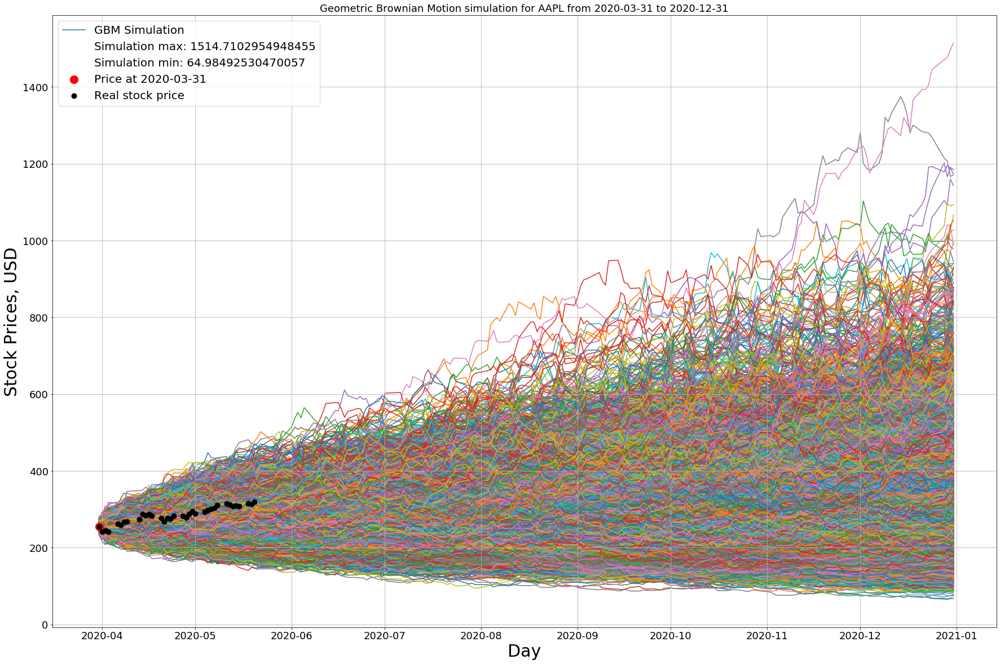



#--------------VaR based on stock prices from the GBM simulation-----------#
#--------------Number of simulations - 10000-----------#
#--------------Total number of prices from the simulation - 1920000-----------#


#--------------Price distribution and VaR at 90% confidence level-----------#
Current stock price: 319.2300109863281
10% of the prices are <=  198.62815437241372
VaR (90%): 120.6018566139144
From 10000 simulations, the probability for the price to go 198.62815437241372 or lower is:  0.1


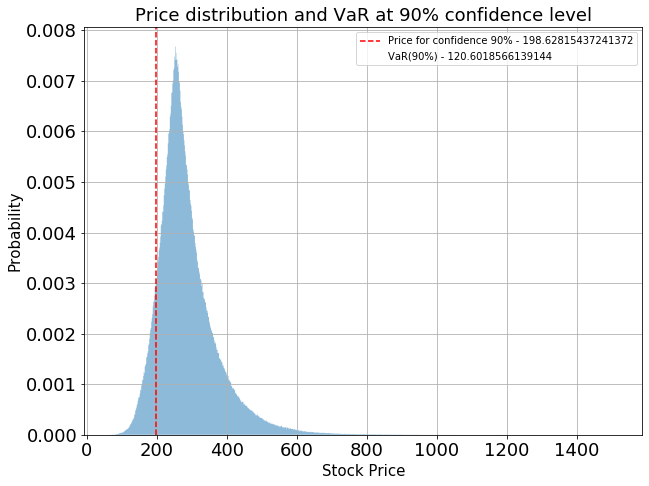

#--------------Price distribution and VaR at 95% confidence level-----------#
Current stock price: 319.2300109863281
5% of the prices are <=  178.32241250676148
VaR (95%): 140.90759847956664
From 10000 simulations, the probability for the price to go 178.32241250676148 or lower is:  0.05


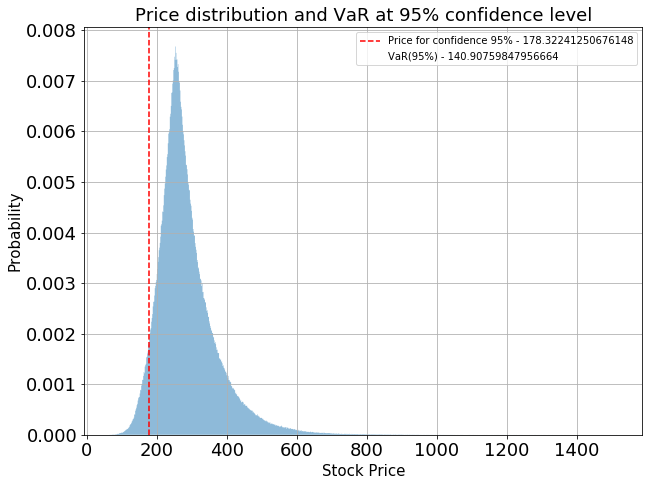

#--------------Price distribution and VaR at 99% confidence level-----------#
Current stock price: 319.2300109863281
1% of the prices are <=  143.8068868639631
VaR (99%): 175.42312412236504
From 10000 simulations, the probability for the price to go 143.8068868639631 or lower is:  0.01


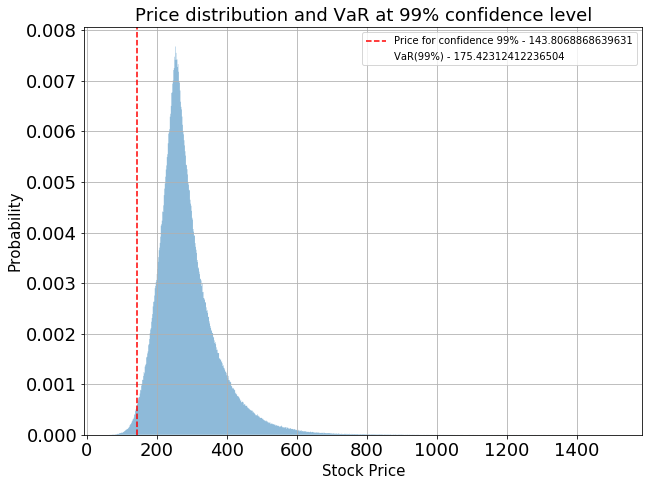



#--------------VaR based on the returns from historical data-----------#


#-------------------------------------------------#
Current stock price: 319.2300109863281
VaR at 90.0%
Theoretical quantile with  0.1: -0.03452111530397538
With 90.0% confidence, worst daily loss will not exceed 3.452111530397538%
One-day Value at Risk for the current stock price: 11.02017601774836


#-------------------------------------------------#
Current stock price: 319.2300109863281
VaR at 95.0%
Theoretical quantile with  0.05: -0.044653331325817704
With 95.0% confidence, worst daily loss will not exceed 4.465333132581771%
One-day Value at Risk for the current stock price: 14.254683449716936


#-------------------------------------------------#
Current stock price: 319.2300109863281
VaR at 99.0%
Theoretical quantile with  0.01: -0.06365968351224008
With 99.0% confidence, worst daily loss will not exceed 6.365968351224008%
One-day Value at Risk for the current stock price: 20.322081466998572




C:\Users\ptsvetkov\AppData\Local\Continuum\anaconda3\lib\site-packages\numpy\lib\histograms.py:824: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
C:\Users\ptsvetkov\AppData\Local\Continuum\anaconda3\lib\site-packages\numpy\lib\histograms.py:825: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


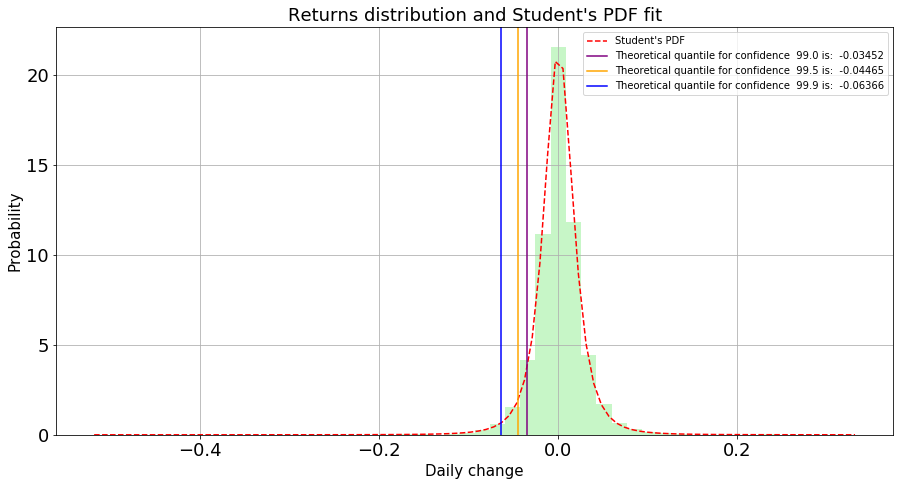

In [80]:
GBM_simulation("AAPL", (1995,1,1), (2020,3,31), (2020,12,31), 10000, confidence=[90, 95, 99], VaR=True, H_VaR=True)
# Runtime is greater for a large amount of simulations, which is at this point understandable
# Performance tunning for the model is at this point not our main focus, but there is surely a way to such.

Quite large number of simulations started with almost 2 milion of stock prices generated.

The real stock price movement is 100% withink our simulations.

VaRs generated for the historical data returns and for all of the stock prices generated. They differ of course, since the stock prices simulated are covering large interval which is only speculation as of now. The historical returns themselves, their mean and standard deviation are kind of expected to be smooth.

Note that returns VaR is usuallt estimated in some amount of investment, but just for the presentation we are doing - in use there is the so called current stock price, which is actually the last available. Having that said, I think is understandable why the final numbers differ from the 2 VaR methods.

We are using exact numbers and not intervals since that is what our implementation aim. At the end of the day we have only 1 number for the stock price and for the daily change, but of course we cannot claim that we are predicting this with proper accuracy, this is only a simulation.



<Figure size 432x288 with 0 Axes>

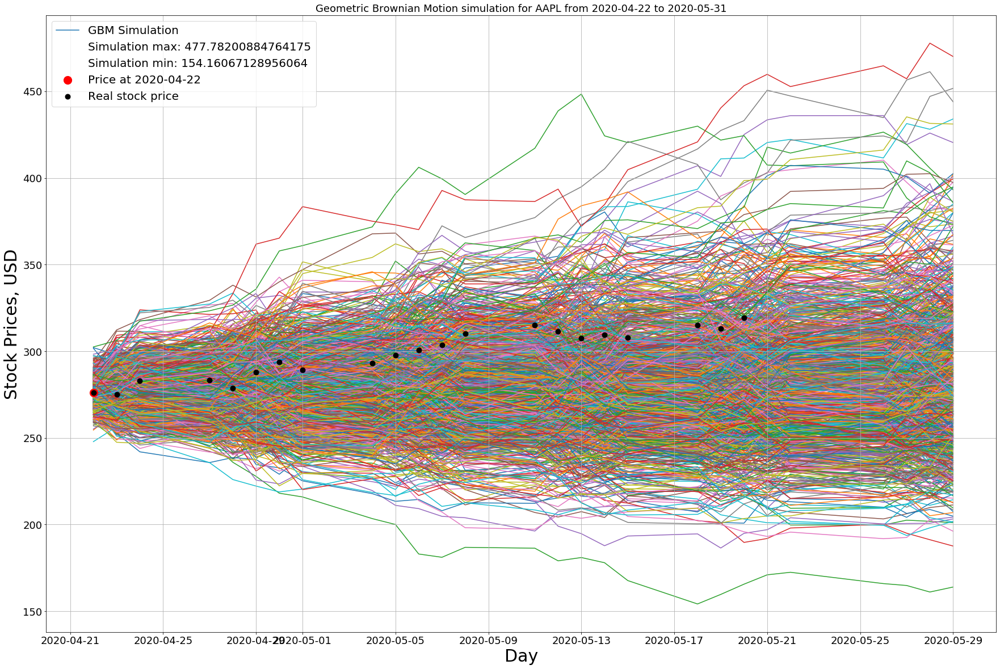



#--------------VaR based on stock prices from the GBM simulation-----------#
#--------------Number of simulations - 1000-----------#
#--------------Total number of prices from the simulation - 27000-----------#


#--------------Price distribution and VaR at 90% confidence level-----------#
Current stock price: 319.2300109863281
10% of the prices are <=  247.9080986671978
VaR (90%): 71.32191231913032
From 1000 simulations, the probability for the price to go 247.9080986671978 or lower is:  0.1


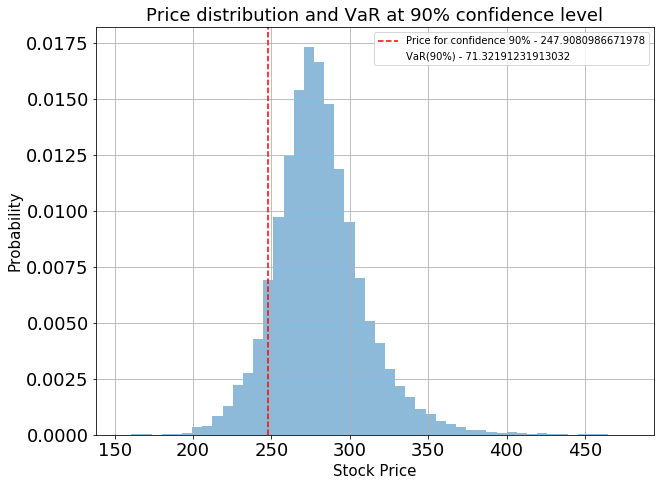

#--------------Price distribution and VaR at 95% confidence level-----------#
Current stock price: 319.2300109863281
5% of the prices are <=  237.52436170739975
VaR (95%): 81.70564927892838
From 1000 simulations, the probability for the price to go 237.52436170739975 or lower is:  0.05


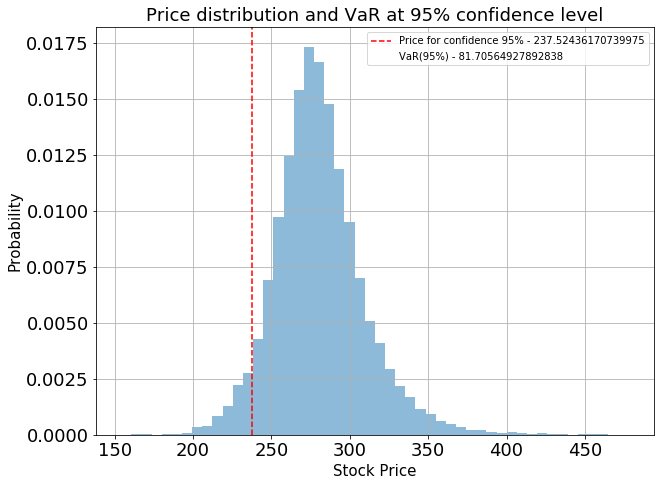

#--------------Price distribution and VaR at 99% confidence level-----------#
Current stock price: 319.2300109863281
1% of the prices are <=  217.23430637978313
VaR (99%): 101.99570460654499
From 1000 simulations, the probability for the price to go 217.23430637978313 or lower is:  0.01


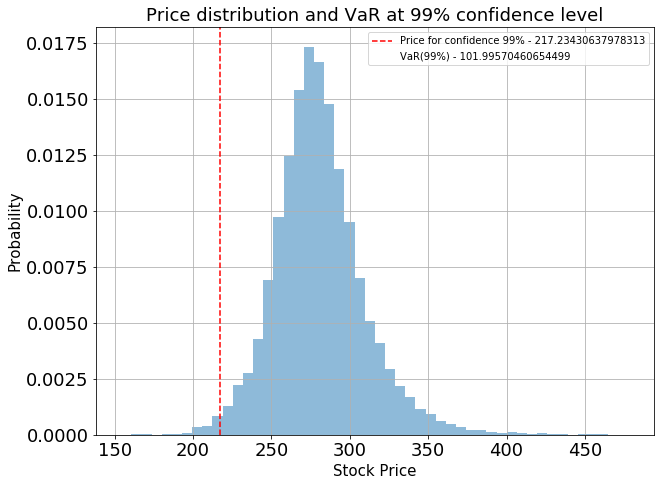



#--------------VaR based on the returns from historical data-----------#


#-------------------------------------------------#
Current stock price: 319.2300109863281
VaR at 90.0%
Theoretical quantile with  0.1: -0.034528941808969996
With 90.0% confidence, worst daily loss will not exceed 3.4528941808969997%
One-day Value at Risk for the current stock price: 11.022674473023777


#-------------------------------------------------#
Current stock price: 319.2300109863281
VaR at 95.0%
Theoretical quantile with  0.05: -0.04466659748596631
With 95.0% confidence, worst daily loss will not exceed 4.466659748596631%
One-day Value at Risk for the current stock price: 14.258918406166922


#-------------------------------------------------#
Current stock price: 319.2300109863281
VaR at 99.0%
Theoretical quantile with  0.01: -0.06368315356079834
With 99.0% confidence, worst daily loss will not exceed 6.368315356079835%
One-day Value at Risk for the current stock price: 20.329573810857678




C:\Users\ptsvetkov\AppData\Local\Continuum\anaconda3\lib\site-packages\numpy\lib\histograms.py:824: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
C:\Users\ptsvetkov\AppData\Local\Continuum\anaconda3\lib\site-packages\numpy\lib\histograms.py:825: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


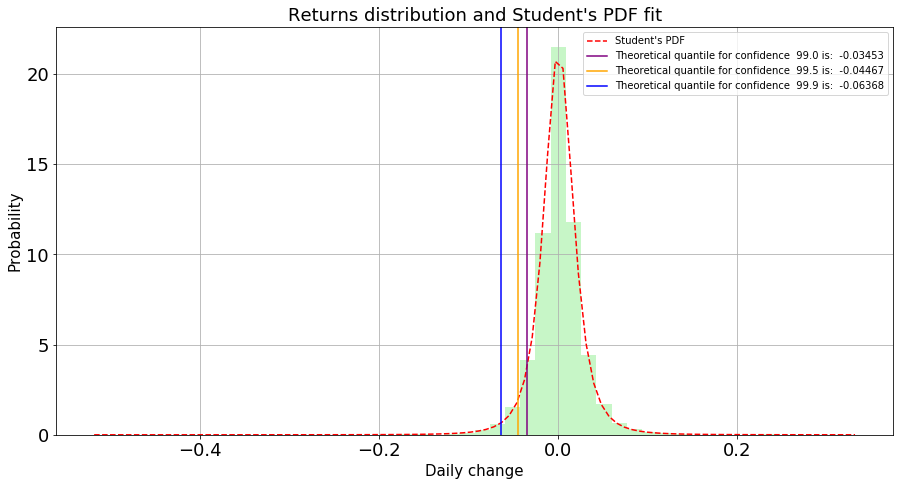

In [56]:
GBM_simulation("AAPL", (1995,1,1), (2020,4,22), (2020,5,31), 1000, confidence=[90, 95, 99], VaR=True, H_VaR=True)

Now we have a tiny simulation for only the month of May 2020 + the same historical data taken.

Note that if an interval entirely in future is picked, by default the function is getting the last 10 official stock prices available as well and shows them. This can make the main simulation not the pretiest if you have a "whole" between the latest available historical data and the target simulation interval, but it actually does not make sense to have this gap at all.


Since we have only 1000 simulations and a month for the simulation it is clear to see that we do not have extremely low or high speculated prices.

<Figure size 432x288 with 0 Axes>

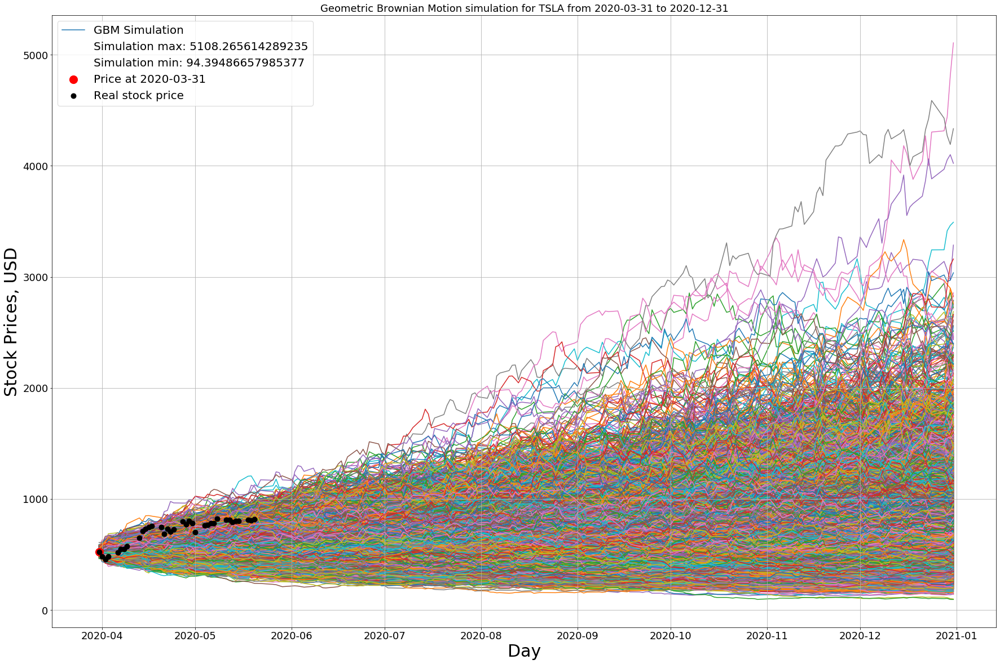



#--------------VaR based on stock prices from the GBM simulation-----------#
#--------------Number of simulations - 10000-----------#
#--------------Total number of prices from the simulation - 1920000-----------#


#--------------Price distribution and VaR at 90% confidence level-----------#
Current stock price: 815.5599975585938
10% of the prices are <=  395.5073390449597
VaR (90%): 420.05265851363407
From 10000 simulations, the probability for the price to go 395.5073390449597 or lower is:  0.1


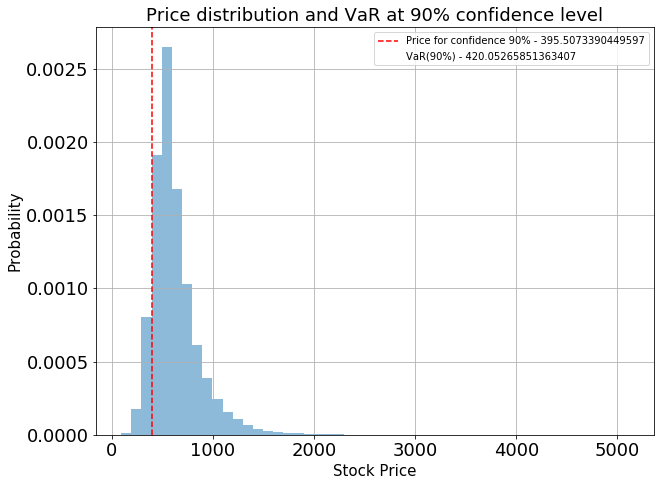

#--------------Price distribution and VaR at 95% confidence level-----------#
Current stock price: 815.5599975585938
5% of the prices are <=  347.02852929282983
VaR (95%): 468.5314682657639
From 10000 simulations, the probability for the price to go 347.02852929282983 or lower is:  0.05


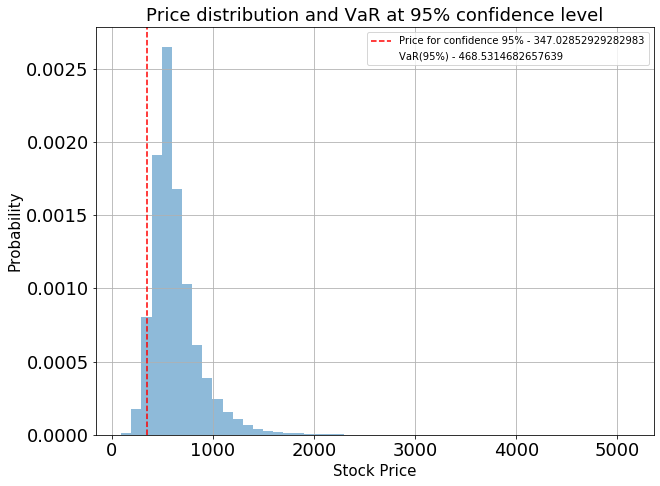

#--------------Price distribution and VaR at 99% confidence level-----------#
Current stock price: 815.5599975585938
1% of the prices are <=  266.06524376070814
VaR (99%): 549.4947537978856
From 10000 simulations, the probability for the price to go 266.06524376070814 or lower is:  0.01


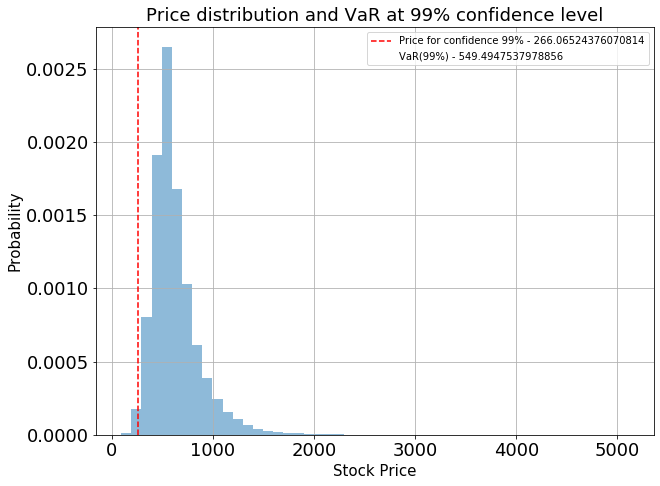



#--------------VaR based on the returns from historical data-----------#


#-------------------------------------------------#
Current stock price: 815.5599975585938
VaR at 90.0%
Theoretical quantile with  0.1: -0.041919130500069034
With 90.0% confidence, worst daily loss will not exceed 4.191913050006903%
One-day Value at Risk for the current stock price: 34.18756596829467


#-------------------------------------------------#
Current stock price: 815.5599975585938
VaR at 95.0%
Theoretical quantile with  0.05: -0.054323519257387
With 95.0% confidence, worst daily loss will not exceed 5.4323519257387005%
One-day Value at Risk for the current stock price: 44.30408923292876


#-------------------------------------------------#
Current stock price: 815.5599975585938
VaR at 99.0%
Theoretical quantile with  0.01: -0.07759208961461624
With 99.0% confidence, worst daily loss will not exceed 7.759208961461623%
One-day Value at Risk for the current stock price: 63.281004416662604




C:\Users\ptsvetkov\AppData\Local\Continuum\anaconda3\lib\site-packages\numpy\lib\histograms.py:824: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
C:\Users\ptsvetkov\AppData\Local\Continuum\anaconda3\lib\site-packages\numpy\lib\histograms.py:825: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


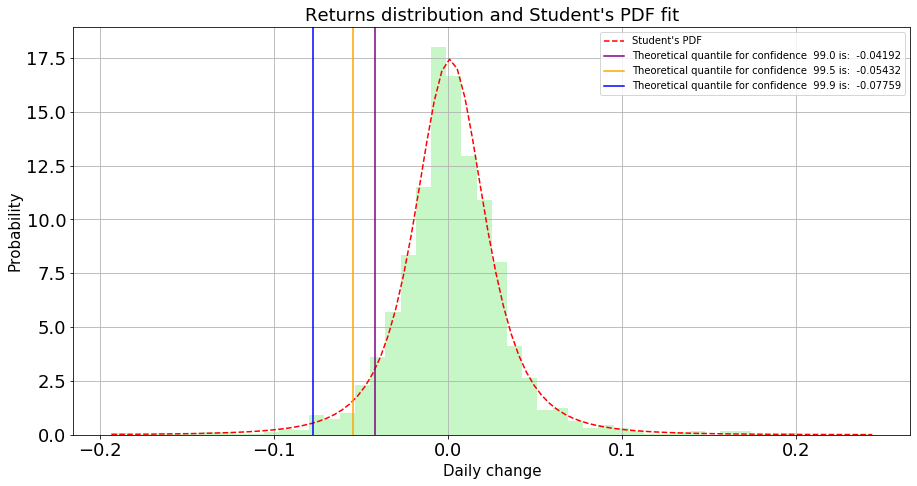

In [57]:
GBM_simulation("TSLA", (1995,1,1), (2020,3,31), (2020,12,31), 10000, confidence=[90, 95, 99], VaR=True, H_VaR=True)

Starting the same type of simulation for the Tesla company and we get our results.

Again pay attention that the daily percent change based value at risk can be applied to potential investment and this is actually something for enhancement in the future of the function, as of now we are just using the "curent" stock price.



<Figure size 432x288 with 0 Axes>

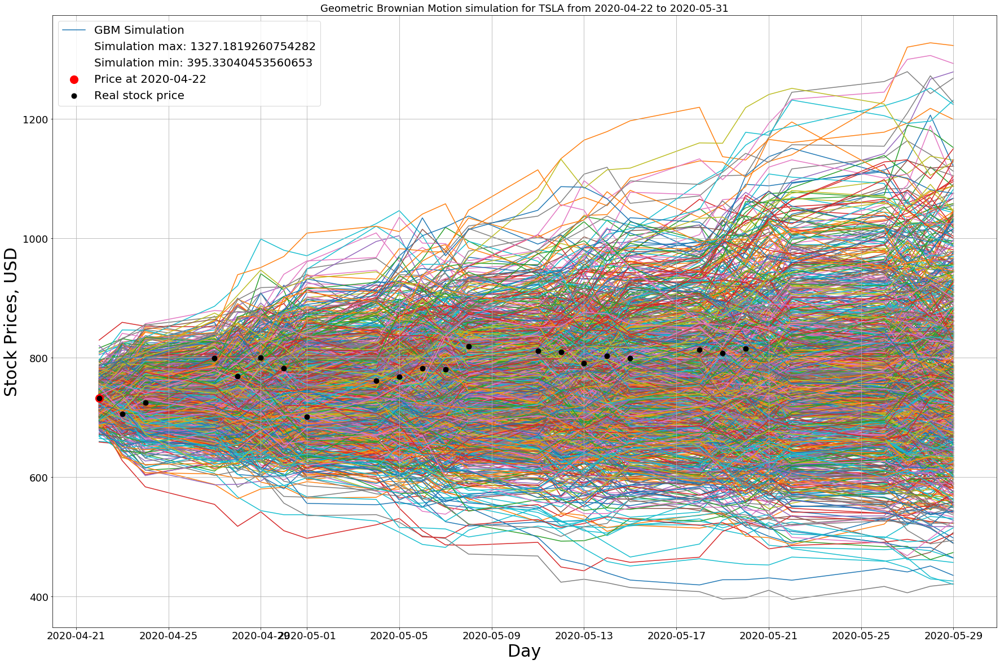



#--------------VaR based on stock prices from the GBM simulation-----------#
#--------------Number of simulations - 1000-----------#
#--------------Total number of prices from the simulation - 27000-----------#


#--------------Price distribution and VaR at 90% confidence level-----------#
Current stock price: 815.5599975585938
10% of the prices are <=  638.941322020466
VaR (90%): 176.61867553812772
From 1000 simulations, the probability for the price to go 638.941322020466 or lower is:  0.1


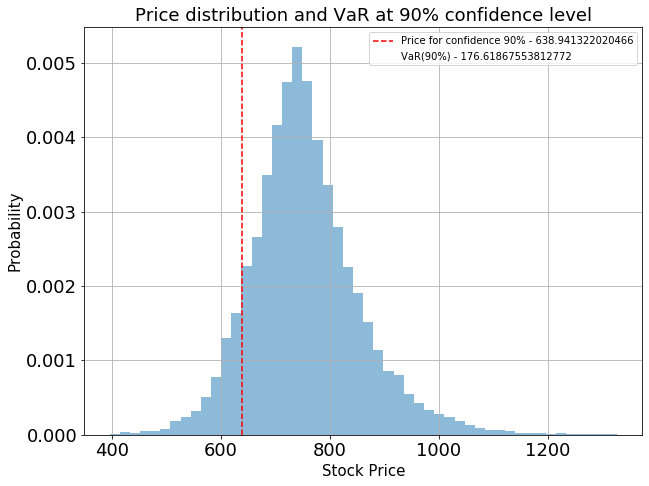

#--------------Price distribution and VaR at 95% confidence level-----------#
Current stock price: 815.5599975585938
5% of the prices are <=  606.9816131157605
VaR (95%): 208.57838444283323
From 1000 simulations, the probability for the price to go 606.9816131157605 or lower is:  0.05


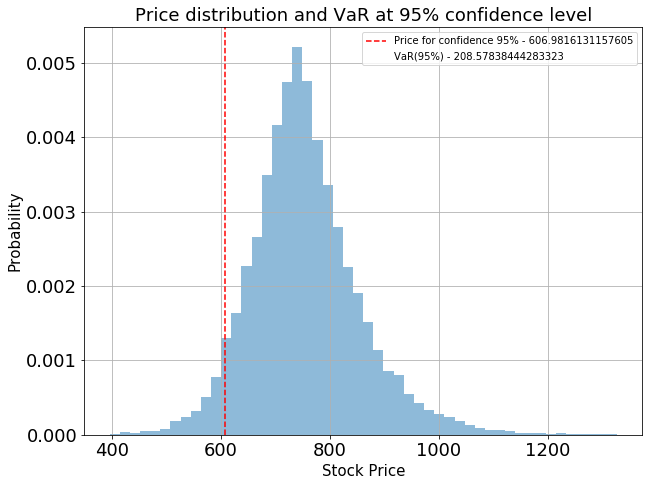

#--------------Price distribution and VaR at 99% confidence level-----------#
Current stock price: 815.5599975585938
1% of the prices are <=  535.0847234748142
VaR (99%): 280.4752740837796
From 1000 simulations, the probability for the price to go 535.0847234748142 or lower is:  0.01


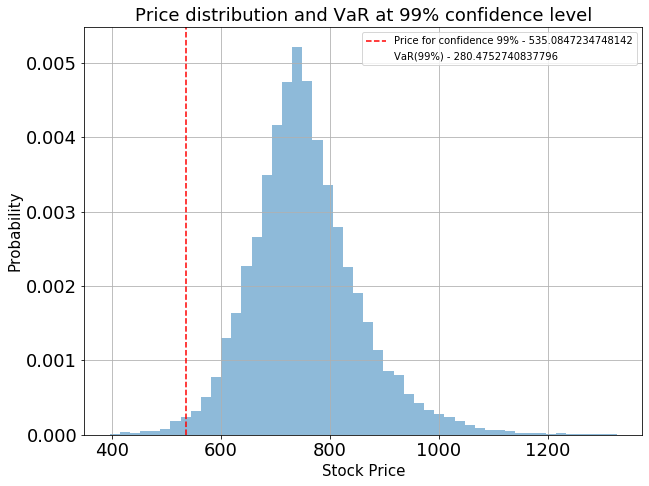



#--------------VaR based on the returns from historical data-----------#


#-------------------------------------------------#
Current stock price: 815.5599975585938
VaR at 90.0%
Theoretical quantile with  0.1: -0.04211471948686834
With 90.0% confidence, worst daily loss will not exceed 4.2114719486868335%
One-day Value at Risk for the current stock price: 34.3470805218912


#-------------------------------------------------#
Current stock price: 815.5599975585938
VaR at 95.0%
Theoretical quantile with  0.05: -0.05461326485143523
With 95.0% confidence, worst daily loss will not exceed 5.461326485143523%
One-day Value at Risk for the current stock price: 44.54039414890335


#-------------------------------------------------#
Current stock price: 815.5599975585938
VaR at 99.0%
Theoretical quantile with  0.01: -0.07805845734484808
With 99.0% confidence, worst daily loss will not exceed 7.805845734484808%
One-day Value at Risk for the current stock price: 63.661355281591895




C:\Users\ptsvetkov\AppData\Local\Continuum\anaconda3\lib\site-packages\numpy\lib\histograms.py:824: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
C:\Users\ptsvetkov\AppData\Local\Continuum\anaconda3\lib\site-packages\numpy\lib\histograms.py:825: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


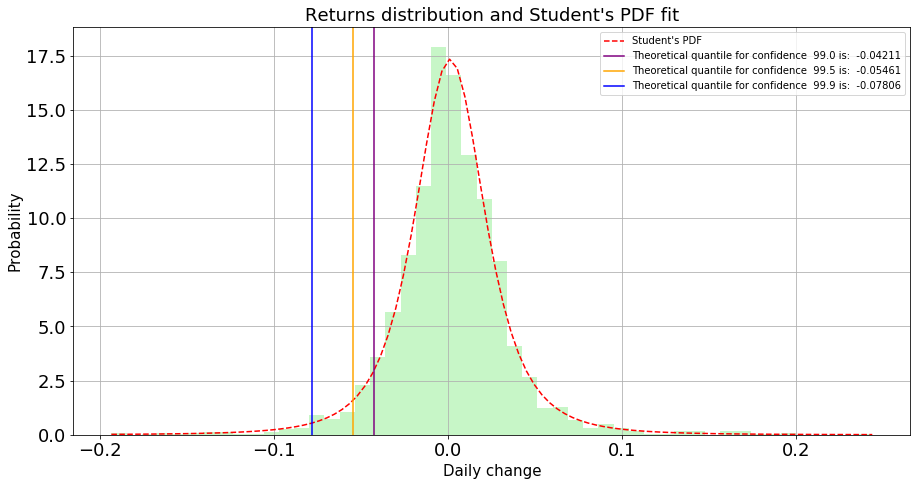

In [58]:
GBM_simulation("TSLA", (1995,1,1), (2020,4,22), (2020,5,31), 1000, confidence=[90, 95, 99], VaR=True, H_VaR=True)

### 8. Conclusion

Lets start with the same question in here - "Howe can we benefit from a random element?". All of the above lines might not be perfect or covering the most accurate calculations and algorithms, but I think they are for sure giving a nice example that at some industries and topics we can actually benefit a lot from a random element, shock, etc.

Moving foward, what we actually look for when we try to apply some simulations with random elements is some kind of data that is really hard to predict. Stock market data is a really nice example for suck, but this can be done for other fields and data as well - in different fields from the physics, in robotics, in different computer games and others. The application in some of the fields might not be straight forward for implementation, in fact some are really complicated, but at some point they are using the randomness to solve problems that might be deterministic in principle and its is working really well sometimes.

Moving back to our particular simulation for the stock market data, we saw that we can do numerous of simulations and predict different stock price paths. If we stop right here, we actually can benefit to see where are the majority of paths going at, which price range ? Isn't it that this price range is more expected to be reached than the others ? In fact we have saw that comparing the speculated stock prices to the real ones (if we have such in the simulations) in almost 100% of the situations, if we have enough number of simulations - the real stock movement is matching some of the simulations exactly. This is actually quite a good example that these simulations have be right, we cannot know for sure which one is the closest one, but that is why we have the computational power and we start a lot of them. Moreover we can see that even if there is some kind of extremen movement for the stock price, it can still match to some simulation path - we have such extreme paths as well, which is really helpful to be prepared for some kind of minor or major recessions and be prepared for them. The only thing we need is an algorithm correct enough to be trusted and a computer that has the resources to start a lot of simulations, the only crucial part for this application is that we need A LOT of simulations. With all of the above being said, I think its quite easy to see the beaty in this at first look simple approach.

We are also not stopping here. In the article there is an additional computation following our stock price simulations - I hope presented in a meaningful way. This one is actually extending the prices we have from our simulation and it is calculating a possible loss in a precission interval that we have. In the largest simulations triggered, we have saw that we are able to get the worst prices, more precisely, the worst 90, 95 or even 99 percent - on a daily basis. These are only speculations, but aren't they a possible scenarios at the end of the day ? They could be, we actually saw that the actual stock prices movement kind of match some of the simulated paths. By using these tiny percentages we can basically predict what the wors day of our investment will be, or with other words the worst daily percent change that we might have. If we have the stock price at 300 USD on Monday and we have this 1% of all the speculated prices for Tuesday at 150 USD, we can basically confirm that there is 99% chance, based on our simulations, that the stock price for Tuesday will not go 150 USD and lower. So we can actually use this with different percentage to determine our eventual stop loss or something similar. And looking at the number actually within this particular example from Monday to Tuesday, it is not a surprise that this is possible, who would expect a -50% change for 1 day. In addition to the VaR computed on our speculated prices, we have also applied a VaR estimated on the historical data only - based on the returns. We can use this for comparison reason, or simply to represent a different approach without any randomness involved.

At the end of the day I think it is relly clear that we CAN benefit a lot from some randomness, if it is placed exactly where it should be, if it is as precise as it need to be and if it is interpreted in a proper way. Combining the different type of complicated algorithms that involve randomness with the computational power that we can get in nowadays, can be a powerful weapon in the right hands. One can not only get benefit from some kind of randomness, but can actually be a step forward from its competitors because of these.

The feeling of predicting the future is quite a good one. In fact, isn't it exactly that, what we have implemented and saw in the above plots? If we take a closer look, we can right now see a thousands of potential different paths of a single stock price that can take and we have a 100% accurace with a large number of simulations, which means that some of our paths match the exact price movements (based on the historical data). Of course its not that easy, since we cannot pick just 1 or 2 path movements, but still - we have got a nice picture of the price movement. What we have used to get a real number is to pick an interval, which is indicating what is the less the price can go to, based on 10 000 simulations in our last executions, which is not a bad one as well.

There are a lot of other things that can tune this model, but I hope you will get the intuition for the basic idea, that if you have a historical data, idea in mind and a suitable model that strongly relies on a little randomness you can achieve great things!

### 9. Improvement of this article and model itself

As this is to be considered as a brief implementation and introduction for the idea of having a randomness in a stock price prediction model, it worth saying on some ideas of improvement on the model and the work being done in here.

For the Geometric Brownian Motion in particular there is multivariate version, which is basically involving multiple correlated price paths and this can be a potential way of extending the current model, of course this one might have an impact on the current implementation and may require additional changes.

Since we are not calculating the expected returns of all of the price paths at the current version of the function, another direction that this can be improved is to get all of the expected returns for the different price paths and perform some speculations on them, eventually extracting some meaningful information from the output data.

There could be some advanced GBM model which need additional data or additional computations to the historical stock data. For example in real life the stock prices volatility changes over time, while in our model we are considering our standard deviation as kind of constant. Probably there could be some time spend on making the model to re-evaluate all some of its components at some point in the future speculations. Again this will probably need additional functions to be implemented and changes to be applied on the current one.

The current function can be changed in a way that it will work for more than one stock. Once this is done, we can think of a solution where we can have a function that is building an investment portfolio based on the gived stocks and is then gathering, presenting and performing some simulations and presentations on the historical data and on the future expected ones from our simulations.

The overall plot for the function can be tunes to have some indicators in addition to the different plots or made as an separate plot. For example there are different indicators and marker that are used on the stock market charts, usually presenting some low/max values, market condition at the moment and at the past, moving averages and other.




### Resources used


[Monte Carlo method](https://en.wikipedia.org/wiki/Monte_Carlo_method#Computer_graphics)

[Geometric Brownian motion](https://en.wikipedia.org/wiki/Geometric_Brownian_motion)

[Standard deviation](https://en.wikipedia.org/wiki/Standard_deviation)

[Law of large numbers](https://en.wikipedia.org/wiki/Law_of_large_numbers)

[Monte Carlo Integration](http://www.cs.toronto.edu/~guerzhoy/180/lectures/W10/lec2/MonteCarloInt.html)


[Probability density function](https://en.wikipedia.org/wiki/Probability_density_function)

[Value at Risk (VaR)](https://www.investopedia.com/terms/v/var.asp)

[Stock market trends and Value at Risk](https://risk-engineering.org/notebook/stock-market.html)

[Percentile](https://en.wikipedia.org/wiki/Percentile)

[What is Probability Density Function (PDF)?](https://www.investopedia.com/terms/p/pdf.asp)

[Calculating VaR using Monte Carlo Simulation](https://financetrain.com/calculating-var-using-monte-carlo-simulation/)

[How to use Monte Carlo simulation with GBM](https://www.investopedia.com/articles/07/montecarlo.asp)

[Simulating stock prices in Python using Geometric Brownian Motion](https://towardsdatascience.com/simulating-stock-prices-in-python-using-geometric-brownian-motion-8dfd6e8c6b18)

[An Introduction to Value at Risk (VAR)](https://www.investopedia.com/articles/04/092904.asp)


Some of these might be already mentioned in the article. Some additional ones are mentioned only in the article, since they are more like an addition.
